# Importing Libraries

In [1]:
!pip install langdetect
!pip install fasttext
!pip install contractions
!pip install spacy 
!python -m spacy download en_core_web_sm  # Small English model (others: md, lg, trf)
!python -m spacy download en_core_web_md  # Small English model (others: md, lg, trf)
!pip install bertopic



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 25.5 MB/s eta 0:00:0000:01
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993222 sha256=229c6dca58535361af942602452fe0f199160e74e1c35409c18ac1013f9a48b6
  Stored in directory: /root/.cache/pip/wheels/0a/f2/b2/e5ca405801e05eb7c8ed5b3b4bcf1fcabcd6272c167640072e
Successfully built langdetect
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 7.9 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.3/118.3 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 62.6 MB/s eta 0:00:00:00:010:01
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart

In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from langdetect import detect
import re
import string
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from nltk import pos_tag

import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('all', quiet=True)

import gensim
from gensim import corpora
from gensim.models import LdaModel, CoherenceModel
import contractions
import spacy


# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /usr/share/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


/kaggle/input/articles/articles1.csv


In [3]:
articles = pd.read_csv('/kaggle/input/articles/articles1.csv')

# Exploring The Data

In [4]:
articles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   50000 non-null  int64  
 1   id           50000 non-null  int64  
 2   title        50000 non-null  object 
 3   publication  50000 non-null  object 
 4   author       43694 non-null  object 
 5   date         50000 non-null  object 
 6   year         50000 non-null  float64
 7   month        50000 non-null  float64
 8   url          0 non-null      float64
 9   content      50000 non-null  object 
dtypes: float64(3), int64(2), object(5)
memory usage: 3.8+ MB


In [5]:
articles.describe()

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,Unnamed: 0,id,year,month,url
count,50000.000000,50000.000000,50000.000000,50000.000000,0.0
mean,25694.378380,44432.454800,2016.273700,5.508940,NaN
std,15350.143677,15773.615179,0.634694,3.333062,NaN
min,0.000000,17283.000000,2011.000000,1.000000,NaN
25%,12500.750000,31236.750000,2016.000000,3.000000,NaN
50%,25004.500000,43757.500000,2016.000000,5.000000,NaN
75%,38630.250000,57479.250000,2017.000000,8.000000,NaN
max,53291.000000,73469.000000,2017.000000,12.000000,NaN


In [6]:
articles.head()

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,Unnamed: 0,id,title,publication,author,date,year,month,url,content
0,0,17283,House Republicans Fret About Winning Their Hea...,New York Times,Carl Hulse,2016-12-31,2016.0,12.0,NaN,WASHINGTON — Congressional Republicans have...
1,1,17284,Rift Between Officers and Residents as Killing...,New York Times,Benjamin Mueller and Al Baker,2017-06-19,2017.0,6.0,NaN,"After the bullet shells get counted, the blood..."
2,2,17285,"Tyrus Wong, ‘Bambi’ Artist Thwarted by Racial ...",New York Times,Margalit Fox,2017-01-06,2017.0,1.0,NaN,"When Walt Disney’s “Bambi” opened in 1942, cri..."
3,3,17286,"Among Deaths in 2016, a Heavy Toll in Pop Musi...",New York Times,William McDonald,2017-04-10,2017.0,4.0,NaN,"Death may be the great equalizer, but it isn’t..."
4,4,17287,Kim Jong-un Says North Korea Is Preparing to T...,New York Times,Choe Sang-Hun,2017-01-02,2017.0,1.0,NaN,"SEOUL, South Korea — North Korea’s leader, ..."


In [7]:
articles['publication'].value_counts()

publication
Breitbart           23781
CNN                 11488
New York Times       7803
Business Insider     6757
Atlantic              171
Name: count, dtype: int64

# Preprocessing

## Named Entity Recognition

In [8]:
# import nltk
# import pandas as pd
# from nltk import pos_tag, ne_chunk
# from nltk.tokenize import word_tokenize

# # nltk.download(['punkt', 'averaged_perceptron_tagger', 'maxent_ne_chunker', 'words'])

# class DocumentProcessor:
#     def __init__(self):
#         self.counter = 0
        
#     def replace_entities(self, text: str) -> str:
#         """Process document with live counter update"""
#         # Tokenization and POS tagging
#         tokens = word_tokenize(text)
#         pos_tags = pos_tag(tokens)
        
#         # Named entity recognition
#         tree = ne_chunk(pos_tags)
        
#         # Entity collection
#         entities = []
#         current_entity = []
#         for node in tree:
#             if isinstance(node, nltk.Tree):
#                 if node.label() in ["GPE", "ORGANIZATION", "PERSON"]:
#                     current_entity.extend([word for word, tag in node.leaves()])
#             elif current_entity:
#                 entities.append(" ".join(current_entity))
#                 current_entity = []
        
#         # Handle any remaining entity
#         if current_entity:
#             entities.append(" ".join(current_entity))
        
#         # Replace entities in text
#         for entity in entities:
#             text = text.replace(entity, entity.replace(" ", "_"))
        
#         # Update and display counter
#         self.counter += 1
#         print(f"\rDocuments processed: {self.counter}", end="", flush=True)
#         return text

# # Initialize processor
# processor = DocumentProcessor()

# # Process articles with live counter
# print("Starting document processing...")
# processed = articles['content'].apply(processor.replace_entities)

# # Final output
# print(f"\n\nTotal documents processed: {processor.counter}")
# print("First processed text:", processed.iloc[0])

In [9]:
import spacy
from spacy.util import minibatch
import pandas as pd
from tqdm import tqdm

# 1. Load model with optimized config
nlp = spacy.load("en_core_web_sm", disable=["parser", "lemmatizer", "textcat"])

# 2. Define core parameters
ENTITY_LABELS = {"GPE", "ORG", "PERSON", "EVENT", "PRODUCT", "NORP"}
BATCH_SIZE = 50

def replace_entities(text: str) -> str:
    """Replace entities in a single document"""
    doc = nlp(text)
    entities = sorted(
        [(ent.start_char, ent.end_char, ent.text) 
         for ent in doc.ents 
         if ent.label_ in ENTITY_LABELS and len(ent) > 1],
        key=lambda x: x[0],
        reverse=True
    )
    
    chars = list(text)
    for start, end, ent_text in entities:
        replacement = ent_text.replace(" ", "_")
        chars[start:end] = list(replacement)
    
    return "".join(chars)

def process_articles(articles: pd.Series) -> pd.Series:
    """Process articles with tqdm progress bar"""
    texts = articles.tolist()
    processed = []
    
    with tqdm(total=len(texts), desc="Processing documents") as pbar:
        for batch in minibatch(texts, size=BATCH_SIZE):
            batch_results = []
            for text in batch:
                # Process individual document
                processed_text = replace_entities(text)
                batch_results.append(processed_text)
                pbar.update(1)  # Update progress by batch size

            processed.extend(batch_results) 
    
    return pd.Series(processed, index=articles.index)

# Usage
processed_text = process_articles(articles['content'])
print("\nFirst processed text:", processed_text.iloc[0])

Processing documents: 100%|██████████| 50000/50000 [47:42<00:00, 17.47it/s]  


First processed text: WASHINGTON  —   Congressional Republicans have a new fear when it comes to their    health care lawsuit against the Obama administration: They might win. The incoming Trump administration could choose to no longer defend the executive branch against the suit, which challenges the administration’s authority to spend billions of dollars on health insurance subsidies for   and   Americans, handing House Republicans a big victory on    issues. But a sudden loss of the disputed subsidies could conceivably cause the health care program to implode, leaving millions of people without access to health insurance before Republicans have prepared a replacement. That could lead to chaos in the insurance market and spur a political backlash just as Republicans gain full control of the government. To stave off that outcome, Republicans could find themselves in the awkward position of appropriating huge sums to temporarily prop up the Obama health care law, angering conservative

## Contraction

In [10]:
from tqdm import tqdm

tqdm.pandas(desc="Contractions")
fixed_content = processed_text.progress_apply(contractions.fix)
fixed_content

Contractions: 100%|██████████| 50000/50000 [00:10<00:00, 4858.48it/s]


0        WASHINGTON  —   Congressional Republicans have...
1        After the bullet shells get counted, the blood...
2        When Walt_Disney’s “Bambi” opened in 1942, cri...
3        Death may be the great equalizer, but it is no...
4        SEOUL, South_Korea  —   North_Korea’s leader, ...
                               ...                        
49995    As chairman and CEO of ExxonMobil, Rex_Tillers...
49996    I have spent nearly 20 years looking at intell...
49997      Donald_Trump will not be taking necessary st...
49998    Dozens of   colleges could be forced to close ...
49999    The force of gravity can be described using a ...
Length: 50000, dtype: object

## Tokenization

In [11]:
tqdm.pandas(desc="Tokenization")

tokens = fixed_content.str.lower().progress_apply(word_tokenize)
tokens

Tokenization: 100%|██████████| 50000/50000 [02:51<00:00, 291.93it/s]


0        [washington, —, congressional, republicans, ha...
1        [after, the, bullet, shells, get, counted, ,, ...
2        [when, walt_disney, ’, s, “, bambi, ”, opened,...
3        [death, may, be, the, great, equalizer, ,, but...
4        [seoul, ,, south_korea, —, north_korea, ’, s, ...
                               ...                        
49995    [as, chairman, and, ceo, of, exxonmobil, ,, re...
49996    [i, have, spent, nearly, 20, years, looking, a...
49997    [donald_trump, will, not, be, taking, necessar...
49998    [dozens, of, colleges, could, be, forced, to, ...
49999    [the, force, of, gravity, can, be, described, ...
Length: 50000, dtype: object

## Removing Stop Words

In [12]:
tqdm.pandas(desc="Tokenization")

stop_words = set(stopwords.words("english"))

def remove_stop_words(text):
    res = [word 
           for word in text 
           if word not in stop_words 
           and word[0].isalpha()]
    return ' '.join(res)

processed_tokens = tokens.progress_apply(remove_stop_words)
processed_tokens

Tokenization: 100%|██████████| 50000/50000 [00:03<00:00, 16305.00it/s]


0        washington congressional republicans new fear ...
1        bullet shells get counted blood dries votive c...
2        walt_disney bambi opened critics praised spare...
3        death may great equalizer necessarily evenhand...
4        seoul south_korea north_korea leader kim said ...
                               ...                        
49995    chairman ceo exxonmobil rex_tillerson admitted...
49996    spent nearly years looking intelligence challe...
49997    donald_trump taking necessary steps resolve co...
49998    dozens colleges could forced close next severa...
49999    force gravity described using number metaphors...
Length: 50000, dtype: object

## Language Detection

In [ ]:
tqdm.pandas(desc="Word Counting")

word_count_filter = processed_tokens.progress_apply(lambda x: len(str(x.strip()).split()) > 10) 
processed_tokens = processed_tokens[word_count_filter]

In [18]:
tqdm.pandas(desc="Language Detection")

langs = processed_tokens.progress_apply(detect)

Language Detection: 100%|██████████| 49589/49589 [05:37<00:00, 146.92it/s]


In [21]:
processed_tokens = processed_tokens[langs == 'en']

## Lemmatization

In [22]:
import spacy
from tqdm import tqdm

# Load spaCy model (run once)
nlp = spacy.load("en_core_web_sm", disable=["ner", "parser", "textcat"])

def spacy_lemmatize(text: str) -> str:
    """Efficient lemmatization with spaCy"""
    doc = nlp(text)
    return " ".join([token.lemma_ for token in doc if not token.is_space])

# Add progress bar
tqdm.pandas(desc="Lemmatizing documents")

# Process with progress tracking
lemmatized_text = processed_tokens.progress_apply(spacy_lemmatize)

print("First lemmatized text:", lemmatized_text.iloc[0])


Lemmatizing documents: 100%|██████████| 49583/49583 [13:41<00:00, 60.38it/s] 

First lemmatized text: washington congressional republicans new fear come health care lawsuit obama administration might win incoming trump administration could choose long defend executive branch suit challenge administration authority spend billion dollar health insurance subsidy americans hand house republicans big victory issue sudden loss dispute subsidy could conceivably health care program implode leave million people without access health insurance republicans prepare replacement could lead chaos insurance market spur political backlash republicans gain full control government stave outcome republican could find awkward position appropriate huge sum temporarily prop obama health care law anger conservative voter demand end law year another twist donald_j._trump administration worry preserve executive branch prerogative could choose fight republican ally house central question dispute eager avoid ugly political pileup republicans capitol hill trump transition team gaming handle 

In [23]:
tqdm.pandas(desc="Word Counting")

word_count_filter = lemmatized_text.progress_apply(lambda x: len(str(x.strip()).split()) > 50) 
lemmatized_text = lemmatized_text[word_count_filter]

Word Counting: 100%|██████████| 49583/49583 [00:00<00:00, 63837.01it/s]


In [24]:
processed_tokens

0        washington congressional republicans new fear ...
1        bullet shells get counted blood dries votive c...
2        walt_disney bambi opened critics praised spare...
3        death may great equalizer necessarily evenhand...
4        seoul south_korea north_korea leader kim said ...
                               ...                        
49995    chairman ceo exxonmobil rex_tillerson admitted...
49996    spent nearly years looking intelligence challe...
49997    donald_trump taking necessary steps resolve co...
49998    dozens colleges could forced close next severa...
49999    force gravity described using number metaphors...
Length: 49583, dtype: object

In [25]:
# nltk.download('averaged_perceptron_tagger', quiet=True)
# nltk.download('all')
# wnl = WordNetLemmatizer()
# POS_MAPPING = {
#     'J': wordnet.ADJ,
#     'V': wordnet.VERB,
#     'N': wordnet.NOUN,
#     'R': wordnet.ADV
# }
# def lemmatize_text(tokens):
#     pos_tags = pos_tag(tokens)
#     lemmas = []
#     for word, tag in pos_tags:
#         wn_pos = POS_MAPPING.get(tag[0].upper(), wordnet.NOUN)
#         lemma = wnl.lemmatize(word, wn_pos)
#         lemmas.append(lemma)
            
#     return ' '.join(lemmas)
# lematized_text = processed_tokens.apply(lemmatize_text)


In [30]:
# lemmatized_text_join = lematized_text.apply(' '.join) 

In [31]:
# lemmatized_text_join[0]

NameError: name 'lemmatized_text_join' is not defined

## Dealing With Nulls

In [33]:
articles.isnull().sum()

Unnamed: 0         0
id                 0
title              0
publication        0
author          6306
date               0
year               0
month              0
url            50000
content            0
dtype: int64

In [34]:
articles.drop(labels='url', inplace=True, axis=1)

In [35]:
articles.isnull().sum()

Unnamed: 0        0
id                0
title             0
publication       0
author         6306
date              0
year              0
month             0
content           0
dtype: int64

In [36]:
(articles['content'] == '').sum()

0

In [37]:
articles['len_content'] = articles['content'].apply(len)


In [38]:
articles['len_content'].sort_values(ascending=False).iloc[:]

17533    149346
22223    119764
7174      96682
6407      85948
32721     76152
          ...  
47948         2
45215         2
42038         1
39869         1
40126         1
Name: len_content, Length: 50000, dtype: int64

In [39]:
articles.sort_values(by='len_content').iloc[:300]

,Unnamed: 0,id,title,publication,author,date,year,month,content,len_content
42038,44395,63359,Enchanting waterfront murals painted while bal...,CNN,Jacopo Prisco,2015-06-01,2015.0,6.0,,1
40126,41809,60745,The week in 32 photos,CNN,NaN,2015-01-23,2015.0,1.0,,1
39869,41452,60381,Wonders of the universe,CNN,NaN,2014-01-10,2014.0,1.0,,1
47726,50859,70606,Here’s how the Bastille Day attack unfolded in...,Business Insider,Mark Abadi,2016-07-15,2016.0,7.0,’’,2
47491,50607,70321,These amazing pictures show what Iraq was like...,Business Insider,Jeremy Bender,2016-06-28,2016.0,6.0,’’,2
...,...,...,...,...,...,...,...,...,...,...
46513,49552,69067,A Japanese railway company is launching an ’in...,Business Insider,NaN,2016-04-10,2016.0,4.0,’’ ’Tokyo’ ’’ ’’ ’’ ’’ ’’ ’’ ’’ ’’ ’’ ’’ ’Toky...,87
40357,42123,61065,2015 Grammys: Red carpet,CNN,NaN,2015-02-08,2015.0,2.0,Musicians and celebrities arrive at the 57th a...,88
21775,21778,40525,Mia Love Will Not Attend Republican National C...,Breitbart,Breitbart News,2016-06-26,2016.0,6.0,Mia Love will not attend the RNC convention an...,88
41208,43309,62257,Boston Marathon bombing evidence,CNN,NaN,2015-03-06,2015.0,3.0,See evidence that was released in the trial of...,88


In [40]:
articles["word_count"] = articles["content"].apply(lambda x: len(str(x).split())) 


In [41]:
articles['word_count'].max()

25519

In [42]:
articles['word_count'].mode()

0    321
Name: word_count, dtype: int64

In [43]:
articles['word_count'].median()

476.0

In [44]:
articles[articles['word_count'] > 2000]['content'].iloc[0]

'After the bullet shells get counted, the blood dries and the votive candles burn out, people peer down from   windows and see crime scenes gone cold: a band of yellow police tape blowing in the breeze. The South Bronx, just across the Harlem River from Manhattan and once shorthand for urban dysfunction, still suffers violence at levels long ago slashed in many other parts of New York City. And yet the city’s efforts to fight it remain splintered, underfunded and burdened by scandal. In the 40th Precinct, at the southern tip of the Bronx, as in other poor, minority neighborhoods across the country, people long hounded for   infractions are crying out for more protection against grievous injury or death. By September, four of every five shootings in the precinct this year were unsolved. Out of the city’s 77 precincts, the 40th has the highest murder rate but the fewest detectives per violent crime, reflecting disparities in staffing that hit hardest in some neighborhoods outside Manhatt

In [46]:
q1 = articles['word_count'].quantile(0.25)
q2 = articles['word_count'].quantile(0.75)

iqr = (q2 - q1) * 1.5 

In [47]:
articles[(articles['word_count'] < (q2 + iqr)) &(articles['word_count'] > 10)]['word_count'].count()

47958

In [48]:
articles[articles['word_count'] > 10].sort_values(by=['word_count'])['content'].iloc[5]

'A look at how CNN’s homepage has evolved through the years. '

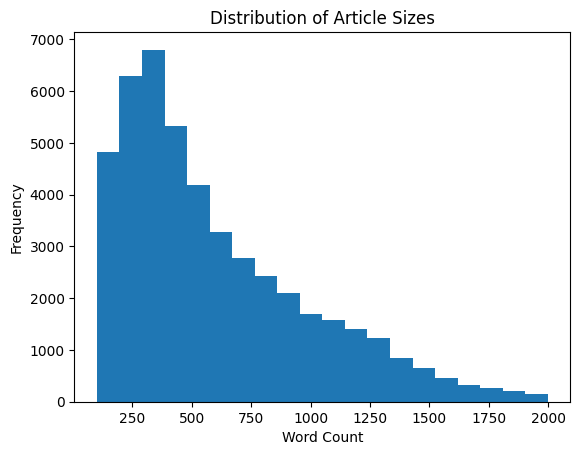

In [49]:
import matplotlib.pyplot as plt

plt.hist(articles[(articles['word_count'] < 2000) &(articles['word_count'] > 100)]["word_count"], bins=20)
plt.xlabel("Word Count")
plt.ylabel("Frequency")
plt.title("Distribution of Article Sizes")
plt.show()

## Dealing With Duplicates

In [50]:
articles.duplicated().sum()

0

# Feature Extraction

## TF-IDF

In [51]:
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
import numpy as np
from tqdm import tqdm
from scipy.sparse import vstack

# 1. Optimize Vectorizer Parameters with progress
tfidf_vectorizer = TfidfVectorizer(
    max_features=30000,
    max_df=0.95,
    min_df=2,
    dtype=np.float32
)

# 2. Proper fitting with progress
print("Fitting vectorizer on full vocabulary...")
with tqdm(total=len(lemmatized_text), desc="Fitting") as pbar:
    tfidf_vectorizer.fit(tqdm(lemmatized_text, 
                            desc="Processing documents", 
                            leave=False))

# 3. Transform in chunks with progress
chunk_size = 1000
tfidf_matrix = None
total_docs = len(lemmatized_text)

with tqdm(total=total_docs, desc="Transforming documents") as pbar:
    for i in range(0, total_docs, chunk_size):
        chunk = lemmatized_text[i:i+chunk_size]
        chunk_matrix = tfidf_vectorizer.transform(chunk)
        
        if tfidf_matrix is None:
            tfidf_matrix = chunk_matrix
        else:
            tfidf_matrix = vstack([tfidf_matrix, chunk_matrix])
        
        pbar.update(len(chunk))

# 4. Memory-efficient inspection
print(f"\nSparse matrix size: {tfidf_matrix.data.nbytes / 1024**2:.2f} MB")

# 5. Progress-based sampling
with tqdm(total=100, desc="Sampling") as sampler:
    sample_df = pd.DataFrame.sparse.from_spmatrix(
        tfidf_matrix[:100], 
        columns=tfidf_vectorizer.get_feature_names_out()
    )
    sampler.update(100)

print("\nSample TF-IDF matrix:")
print(sample_df.head())

# 6. Cleanup with feedback
# del sample_df
# _ = gc.collect()
# print("Memory cleanup completed")

# 7. Progress-enhanced analysis
print("Calculating feature importance...")
with tqdm(total=3, desc="Analysis") as analyzer:
    average_tfidf = np.array(tfidf_matrix.mean(axis=0)).flatten()
    analyzer.update(1)
    
    top_features = np.argsort(average_tfidf)[-10:]
    analyzer.update(1)
    
    print("\nTop 10 features by average TF-IDF score:")
    print(tfidf_vectorizer.get_feature_names_out()[top_features])
    analyzer.update(1)

Fitting vectorizer on full vocabulary...


Transforming documents: 100%|██████████| 48009/48009 [00:09<00:00, 4890.26it/s]



Sparse matrix size: 37.90 MB


Sampling: 100%|██████████| 100/100 [00:00<00:00, 543.64it/s]



Sample TF-IDF matrix:
   _11  _2  __border  __coalition  __relation  __relationship        _a  \
0    0   0         0            0           0               0         0   
1    0   0         0            0           0               0         0   
2    0   0         0            0           0               0         0   
3    0   0         0            0           0               0  0.025276   
4    0   0         0            0           0               0         0   

   _abrams  _air_force  _alito_jr  ...  zuma  zurich  zverev  état  الله  على  \
0        0           0          0  ...     0       0       0     0     0    0   
1        0           0          0  ...     0       0       0     0     0    0   
2        0           0          0  ...     0       0       0     0     0    0   
3        0           0          0  ...     0       0       0     0     0    0   
4        0           0          0  ...     0       0       0     0     0    0   

   في  لا  من  هذا  
0   0   0   0    0

Analysis: 100%|██████████| 3/3 [00:00<00:00, 37.30it/s]


Top 10 features by average TF-IDF score:
['year' 'clinton' 'one' 'go' 'would' 'people' 'president' 'mr' 'trump'
 'say']


In [52]:
# from sklearn.feature_extraction.text import TfidfVectorizer

# # Create TF-IDF vectorizer
# tfidf_vectorizer = TfidfVectorizer()

# # Fit and transform the documents
# tfidf_matrix = tfidf_vectorizer.fit_transform(lemmatized_text_join)

# # Get feature names (terms)
# feature_names = tfidf_vectorizer.get_feature_names_out()

# # Convert to dense array (for visualization)
# dense_array = tfidf_matrix.toarray()

# # Convert to DataFrame for better visualization
# import pandas as pd
# df_tfidf = pd.DataFrame(dense_array, columns=feature_names)
# print(df_tfidf)

# EDA

# Modeling

In [70]:
    # Word Cloud Generation
    def create_wordcloud(weights, title, num_top_words):
        word_freq = {feature_names[i]: weights[i] 
                     for i in np.argsort(weights)[-num_top_words:]}
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud)
        plt.title(title)
        plt.axis("off")
        plt.show()

In [80]:
    # Document Projection Visualization
    def visualize_projection(max_docs, palette, model_name):
        try:
            if tfidf_matrix is None:
                return
                
            # Subsample if too many documents
            if tfidf_matrix.shape[0] > max_docs:
                indices = np.random.choice(tfidf_matrix.shape[0], max_docs, replace=False)
                matrix_sample = tfidf_matrix[indices]
            else:
                matrix_sample = tfidf_matrix
                
            # Get document representations
            if hasattr(model, 'transform'):
                doc_representation = model.transform(matrix_sample)
            else:  # For clustering models
                doc_representation = model.predict_proba(matrix_sample)
                
            # Reduce dimensionality
            tsne = TSNE(n_components=2, perplexity=30, random_state=42)
            embeddings = tsne.fit_transform(doc_representation)
            
            # Get labels for coloring
            if hasattr(model, 'components_'):
                labels = np.argmax(doc_representation, axis=1)
            else:
                labels = model.predict(matrix_sample)
            
            # Plot
            plt.figure(figsize=(12, 8))
            sns.scatterplot(x=embeddings[:,0], y=embeddings[:,1], 
                           hue=labels, palette=palette, 
                           alpha=0.7, s=50, edgecolor='none')
            plt.title(f"{model_name} Document Projection (t-SNE)")
            plt.axis('off')
            plt.show()
            
        except Exception as e:
            print(f"Visualization error: {str(e)}")


In [63]:
    # Evaluation metrics functions
    def calculate_coherence(topics):
        if tokenized_docs is None:
            return None
        dictionary = Dictionary(tokenized_docs)
        coherence_model = CoherenceModel(topics=topics,
                                        texts=tokenized_docs,
                                        dictionary=dictionary,
                                        coherence='c_v')
        return coherence_model.get_coherence()

    def calculate_diversity(topics):
        unique_words = len(set(word for topic in topics for word in topic))
        total_words = len(topics)*len(topics[0])
        return unique_words / total_words

    def calculate_exclusivity(topics):
        word_counts = defaultdict(int)
        for topic in topics:
            for word in set(topic):
                word_counts[word] += 1
        return sum(1/count for count in word_counts.values()) / len(word_counts)

    def calculate_perplexity():
        if isinstance(model, LatentDirichletAllocation):
            log_likelihood = model.score(tfidf_matrix)
            return np.exp(-log_likelihood / np.sum(tfidf_matrix.data))
        return None

    def calculate_silhouette():
        if hasattr(model, 'cluster_centers_'):
            cluster_labels = model.predict(tfidf_matrix)
            return silhouette_score(tfidf_matrix, cluster_labels)
        return None

In [81]:
def display_topics(model, feature_names, tfidf_matrix=None, 
                  num_top_words=10, verbose=True, max_docs=10000,
                  tokenized_docs=None, documents=None):
    """
    Display topics with visualization and evaluation metrics
    """
    model_name = model.__class__.__name__
    print(f"\n{model_name} Results:")
    
    # Generate consistent colors for topics/clusters
    n_topics = len(model.components_) if hasattr(model, 'components_') else len(model.cluster_centers_)
    palette = sns.color_palette("husl", n_topics)
    
    # Main logic
    components = []
    entries = []
    topics = []
    
    if hasattr(model, 'components_'):
        components = np.abs(model.components_) if isinstance(model, TruncatedSVD) else model.components_
    elif hasattr(model, 'cluster_centers_'):
        components = model.cluster_centers_
    
    # Generate topics and entries
    for idx, comp in enumerate(components):
        top_indices = np.argsort(comp)[-num_top_words:][::-1]
        top_words = [feature_names[i] 
                     for i in top_indices]
        entry = "_".join(top_words[:3])
        entries.append(entry)
        topics.append(top_words)  # For metrics
        
        if verbose:
            create_wordcloud(comp, f"Topic {idx+1}: {entry}", num_top_words)
            print(f"{entry} ({idx:03d}): {', '.join(top_words)}")
    
    # Calculate and display metrics
    print("\nEvaluation Metrics:")
    
    # Coherence Score
    coherence = calculate_coherence(topics)
    if coherence is not None:
        print(f"- Coherence (c_v): {coherence:.3f}")
    
    # Diversity
    diversity = calculate_diversity(topics)
    print(f"- Diversity: {diversity:.1%}")
    
    # Exclusivity
    exclusivity = calculate_exclusivity(topics)
    print(f"- Exclusivity: {exclusivity:.3f}")
    
    # Perplexity (LDA only)
    perplexity = calculate_perplexity()
    if perplexity is not None:
        print(f"- Perplexity: {perplexity:.1f}")
    
    # Silhouette Score (Clustering only)
    silhouette = calculate_silhouette()
    if silhouette is not None:
        print(f"- Silhouette Score: {silhouette:.3f}")
    
    # Show document projection
    if verbose and tfidf_matrix is not None:
        visualize_projection(max_docs, palette, model_name)
    
    # Document samples
    if documents is not None and verbose:
        print("\nDocument Samples:")
        doc_topic = model.transform(tfidf_matrix).argmax(axis=1) if hasattr(model, 'transform') else model.predict(tfidf_matrix)
        for topic_idx in range(min(3, len(topics))):  # Show first 3 topics
            print(f"\nTopic {topic_idx+1} Documents:")
            topic_docs = [doc for doc, t in zip(documents, doc_topic) if t == topic_idx]
            for doc in topic_docs[:2]:  # Show 2 samples per topic
                print(f" - {doc[:100]}...")

    if not verbose:
        print(f"Top {num_top_words} topics: {', '.join(entries[:5])}...")


Training NMF model
[[0.         0.02122679 0.00608768 0.         0.         0.
  0.05299707 0.00424034 0.00834564 0.02822403 0.         0.
  0.         0.         0.00778716 0.         0.00259758 0.
  0.0116759  0.        ]]
washington congressional republicans new fear come health care lawsuit obama administration might win incoming trump administration could choose long defend executive branch suit challenge administration authority spend billion dollar health insurance subsidy americans hand house republicans big victory issue sudden loss dispute subsidy could conceivably health care program implode leave million people without access health insurance republicans prepare replacement could lead chaos insurance market spur political backlash republicans gain full control government stave outcome republican could find awkward position appropriate huge sum temporarily prop obama health care law anger conservative voter demand end law year another twist donald_j._trump administration wo

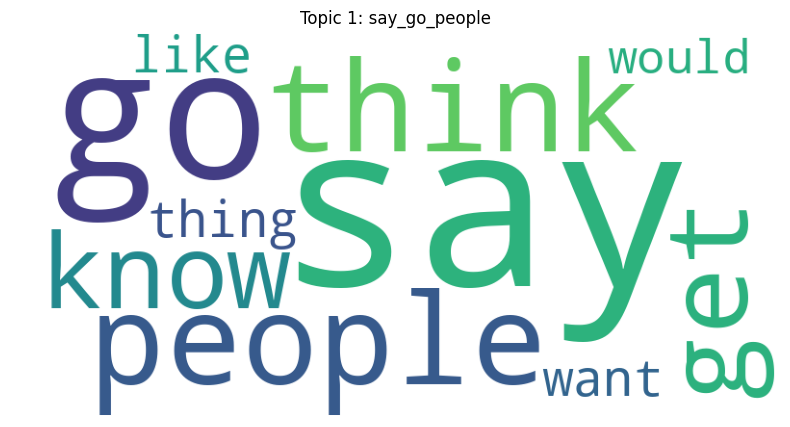

say_go_people (000): say, go, people, think, get, know, thing, want, like, would


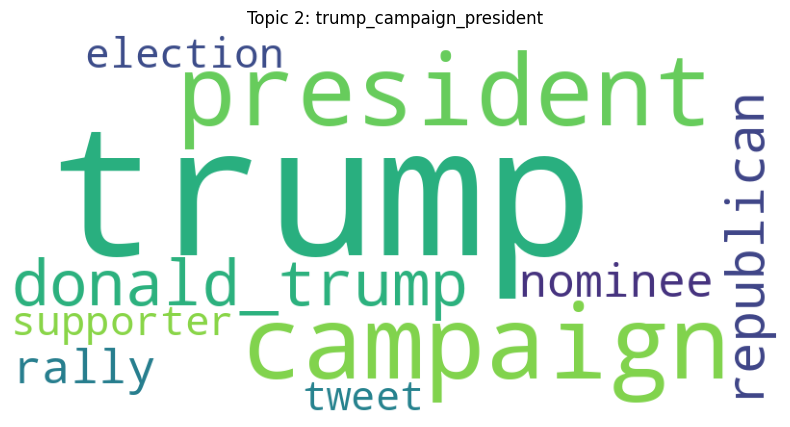

trump_campaign_president (001): trump, campaign, president, donald_trump, republican, rally, nominee, supporter, election, tweet


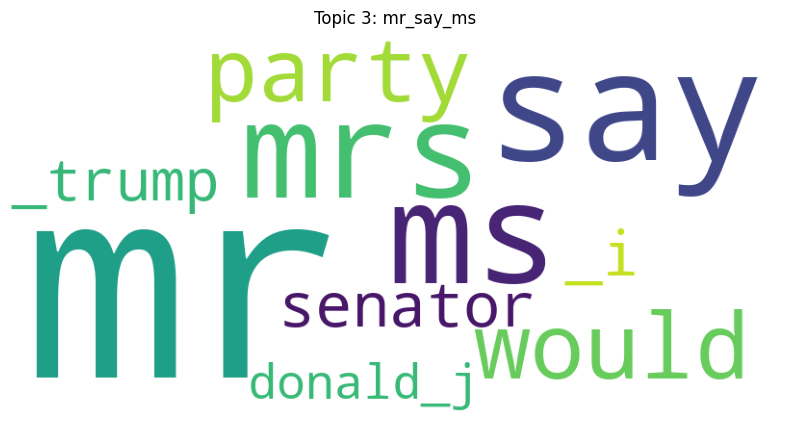

mr_say_ms (002): mr, say, ms, mrs, would, party, senator, _i, _trump, donald_j


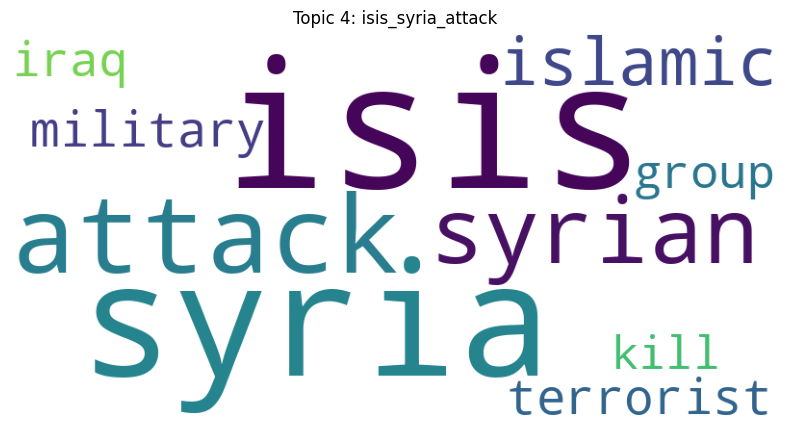

isis_syria_attack (003): isis, syria, attack, syrian, islamic, terrorist, military, iraq, group, kill


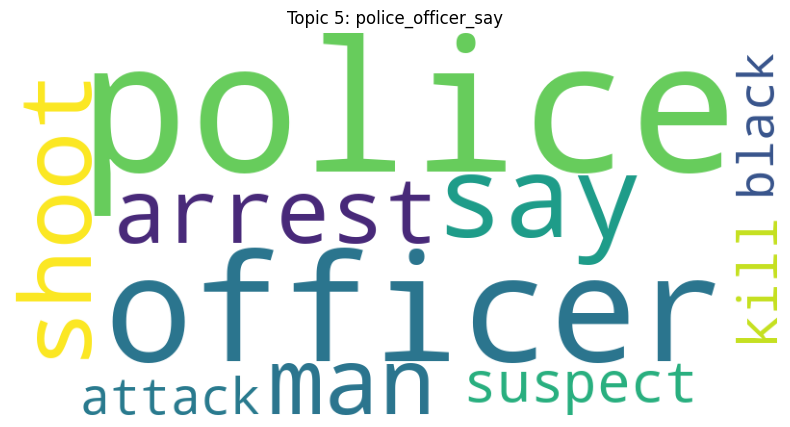

police_officer_say (004): police, officer, say, shoot, man, arrest, suspect, kill, attack, black


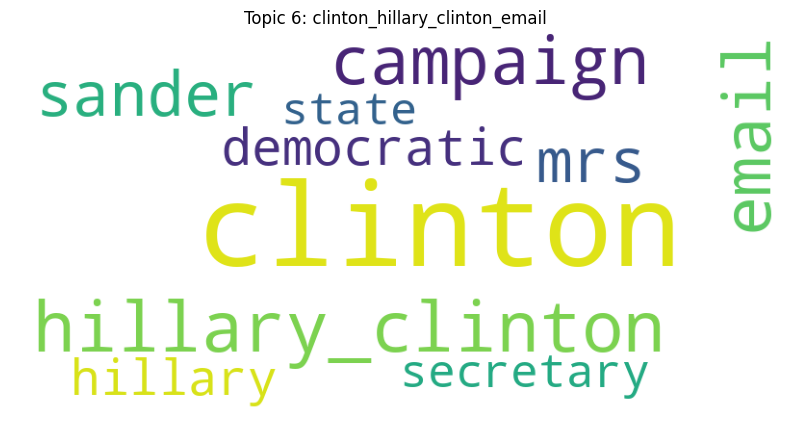

clinton_hillary_clinton_email (005): clinton, hillary_clinton, email, campaign, sander, mrs, democratic, hillary, secretary, state


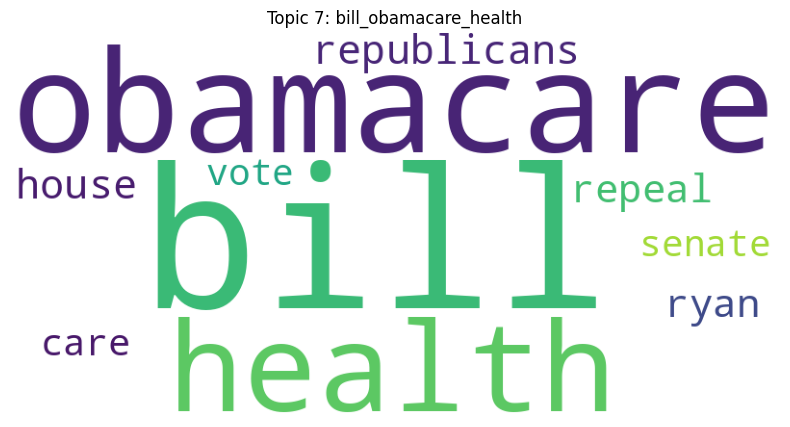

bill_obamacare_health (006): bill, obamacare, health, republicans, house, repeal, ryan, care, vote, senate


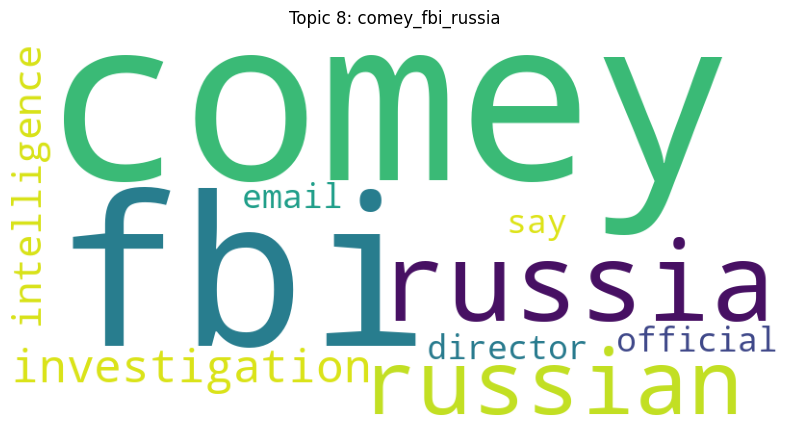

comey_fbi_russia (007): comey, fbi, russia, russian, investigation, intelligence, say, email, official, director


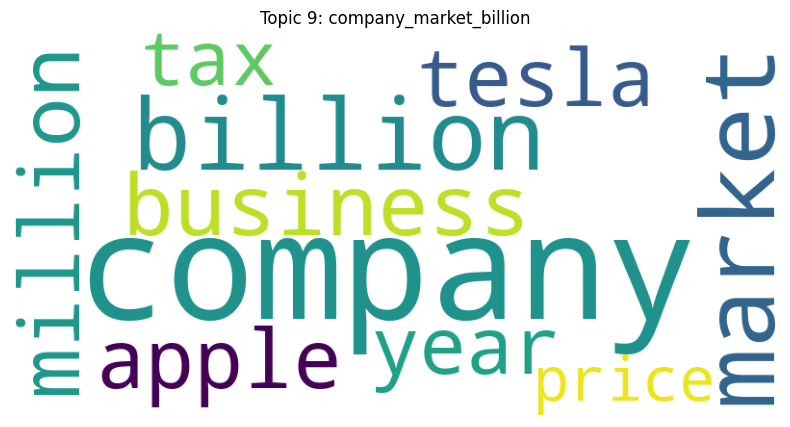

company_market_billion (008): company, market, billion, business, million, apple, tesla, year, tax, price


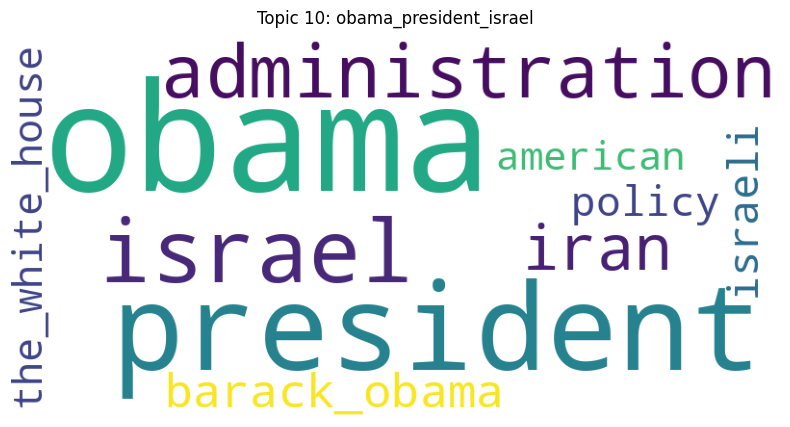

obama_president_israel (009): obama, president, israel, administration, iran, barack_obama, israeli, policy, the_white_house, american


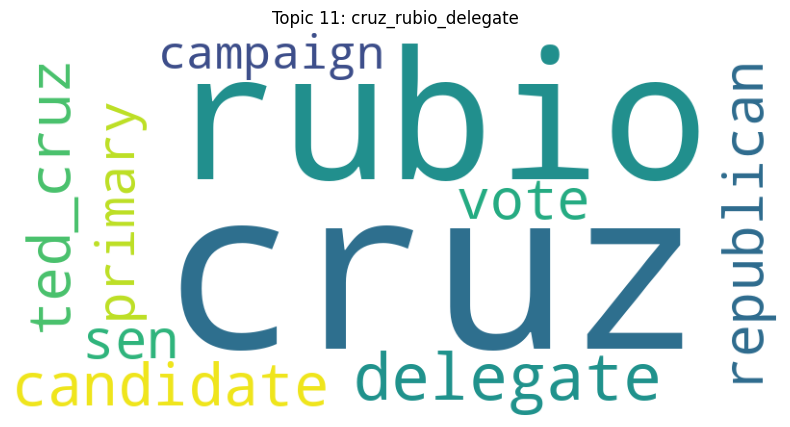

cruz_rubio_delegate (010): cruz, rubio, delegate, candidate, ted_cruz, vote, republican, sen, primary, campaign


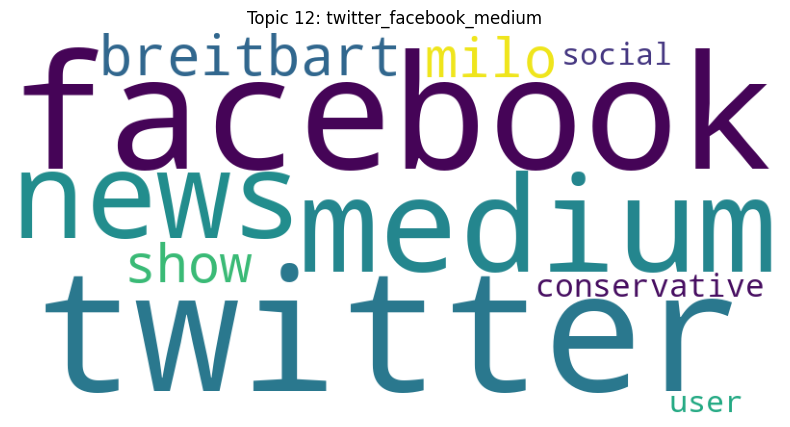

twitter_facebook_medium (011): twitter, facebook, medium, news, breitbart, milo, show, conservative, user, social


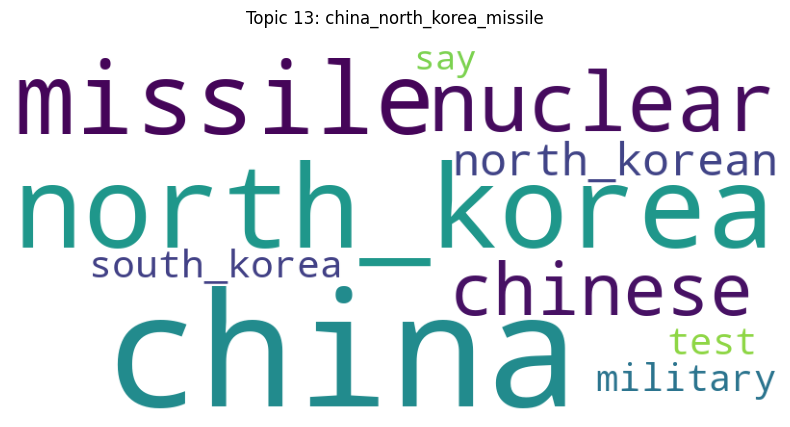

china_north_korea_missile (012): china, north_korea, missile, nuclear, chinese, north_korean, south_korea, test, military, say


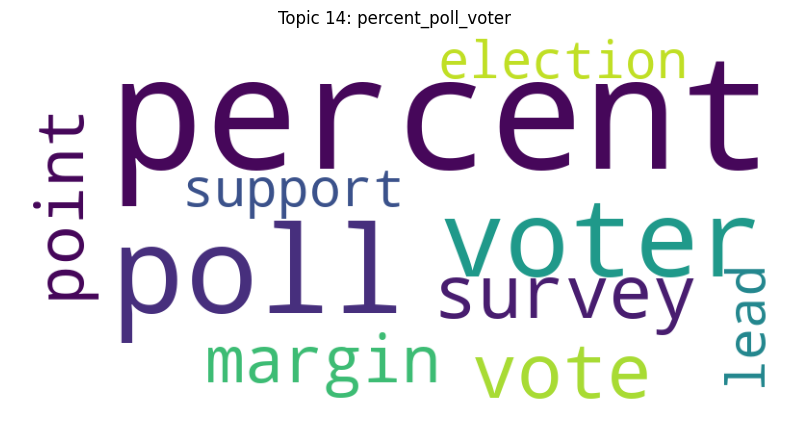

percent_poll_voter (013): percent, poll, voter, vote, survey, margin, point, support, lead, election


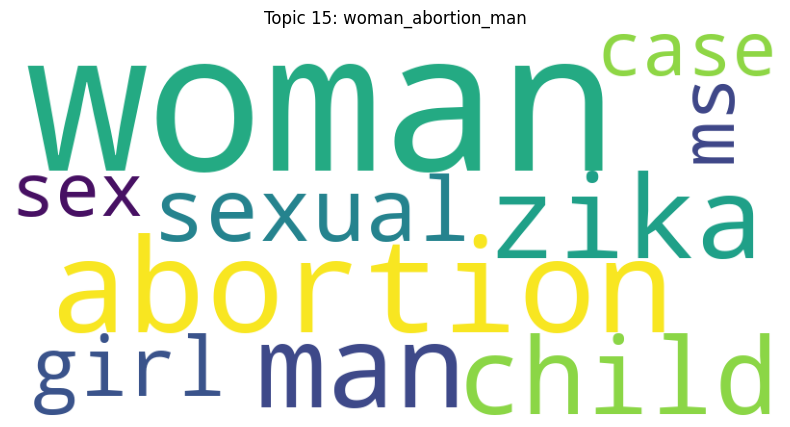

woman_abortion_man (014): woman, abortion, man, zika, child, sexual, girl, case, ms, sex


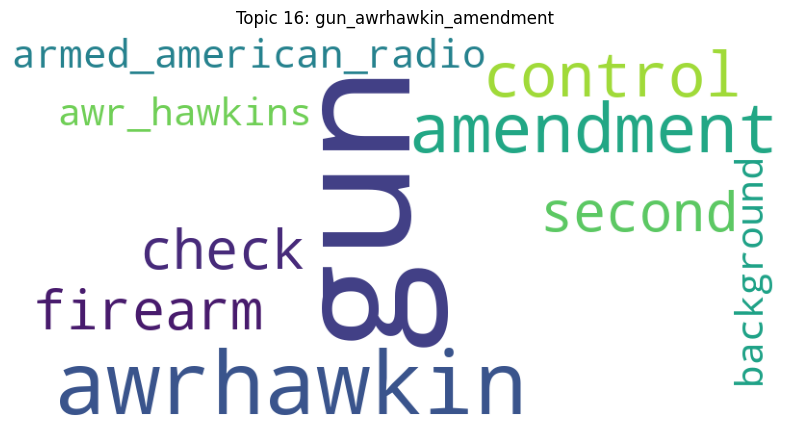

gun_awrhawkin_amendment (015): gun, awrhawkin, amendment, control, second, check, firearm, armed_american_radio, awr_hawkins, background


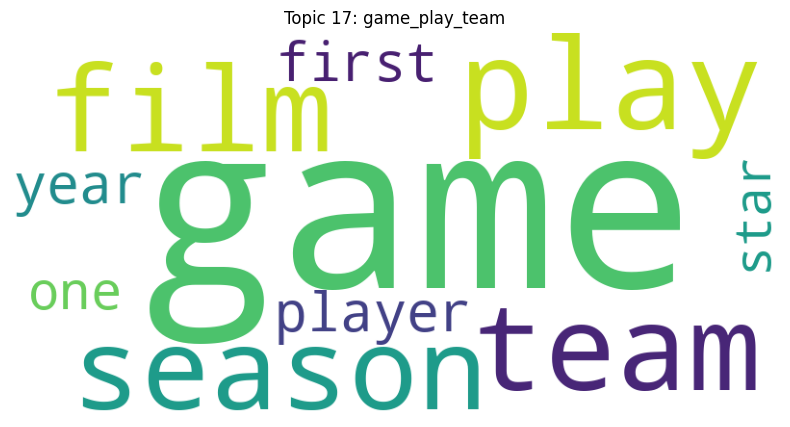

game_play_team (016): game, play, team, film, season, player, year, first, one, star


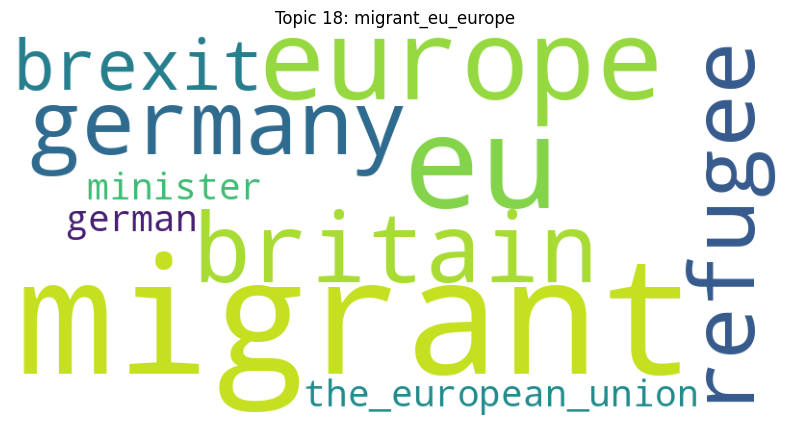

migrant_eu_europe (017): migrant, eu, europe, britain, germany, refugee, brexit, the_european_union, minister, german


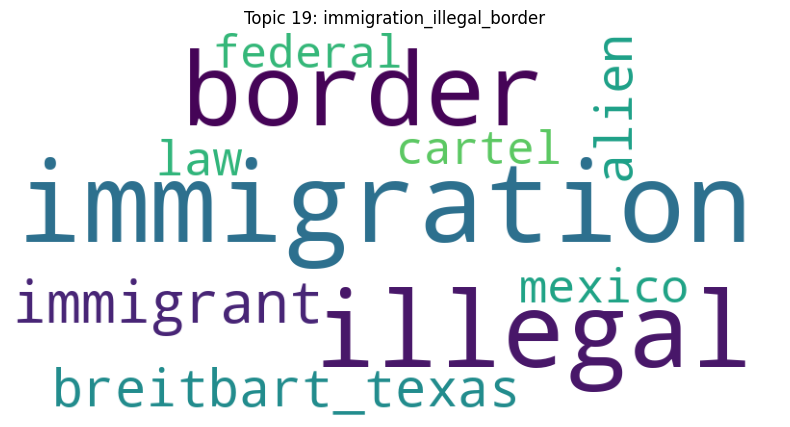

immigration_illegal_border (018): immigration, illegal, border, immigrant, breitbart_texas, alien, law, mexico, cartel, federal


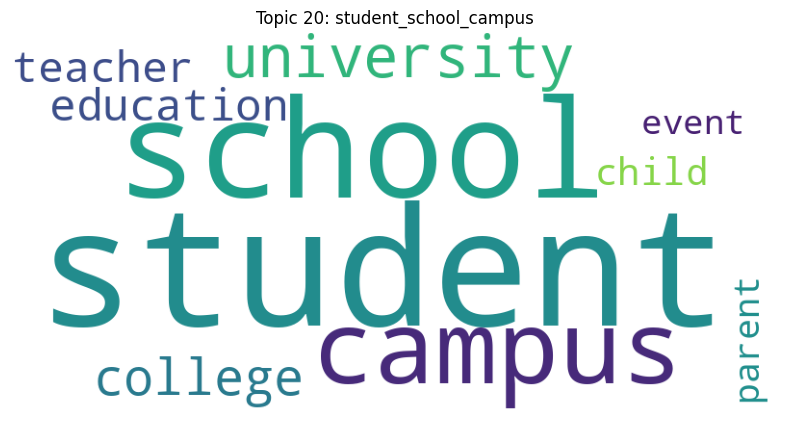

student_school_campus (019): student, school, campus, university, college, education, teacher, child, parent, event

Evaluation Metrics:
- Coherence (c_v): 0.686
- Diversity: 89.5%
- Exclusivity: 0.952


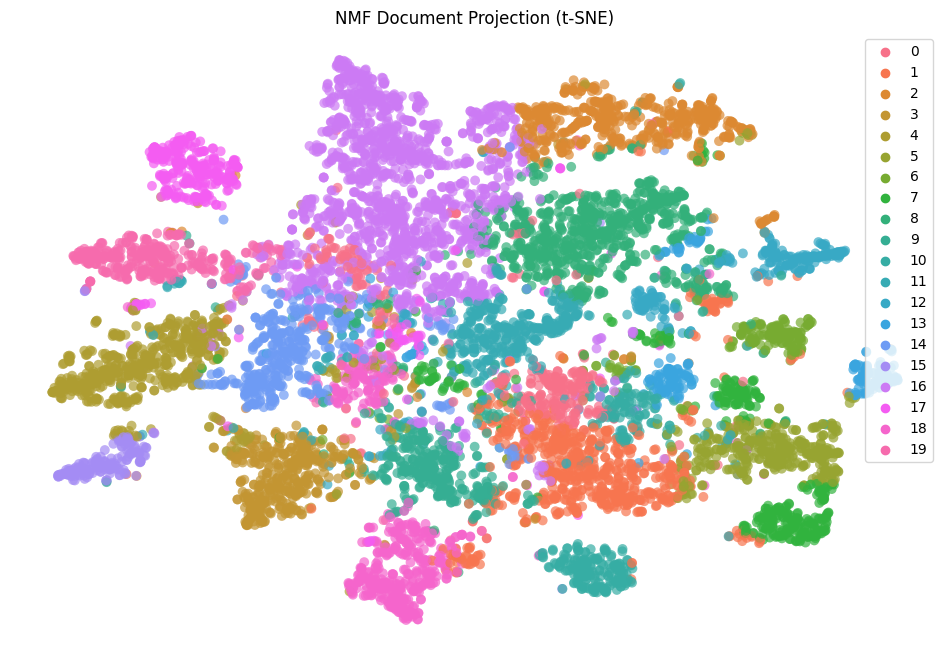


Document Samples:

Topic 1 Documents:
 - year ago conversation one great biologist century take weird turn talk william_d._hamilton famous co...
 - jennifer_holliday sing reagan sing bush father son sing clinton planner year presidential inaugurati...

Topic 2 Documents:
 - hour father news conference wednesday trump tower ivanka_trump post notice personal facebook page of...
 - donald_j._trump run campaign promise dismantle affordable care act come surprise sign executive orde...

Topic 3 Documents:
 - walt_disney bambi open critic praise spare haunt visual style vastly different anything disney do kn...
 - hillary_kerr founder digital medium company los_angeles tell song play five year ago jukebox bar som...

Training LDA model
[[0.00377242 0.00377242 0.00377242 0.00377242 0.28174007 0.00377242
  0.00377242 0.00377242 0.00377242 0.00377242 0.65035635 0.00377242
  0.00377242 0.00377242 0.00377242 0.00377242 0.00377242 0.00377242
  0.00377242 0.00377242]]
washington congressional repu

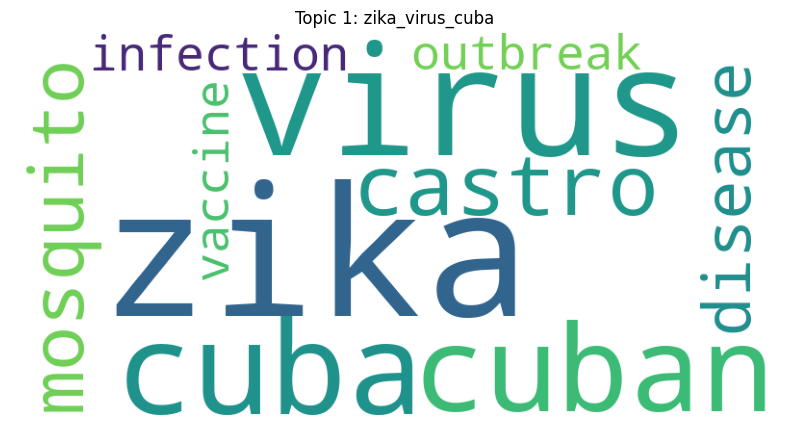

zika_virus_cuba (000): zika, virus, cuba, cuban, castro, mosquito, disease, infection, outbreak, vaccine


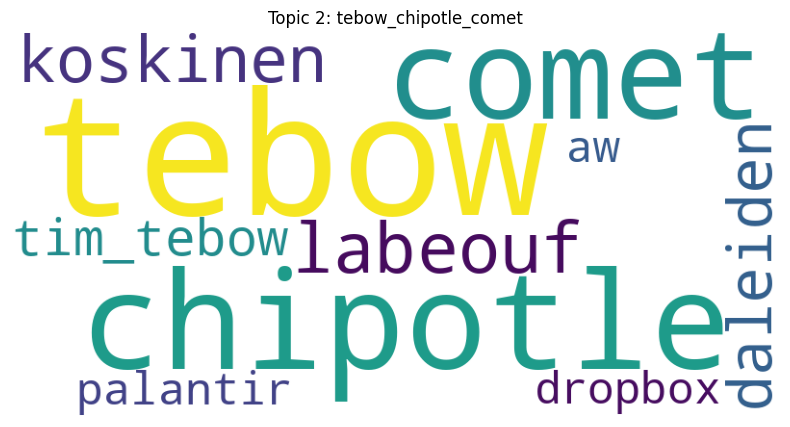

tebow_chipotle_comet (001): tebow, chipotle, comet, labeouf, koskinen, daleiden, tim_tebow, palantir, aw, dropbox


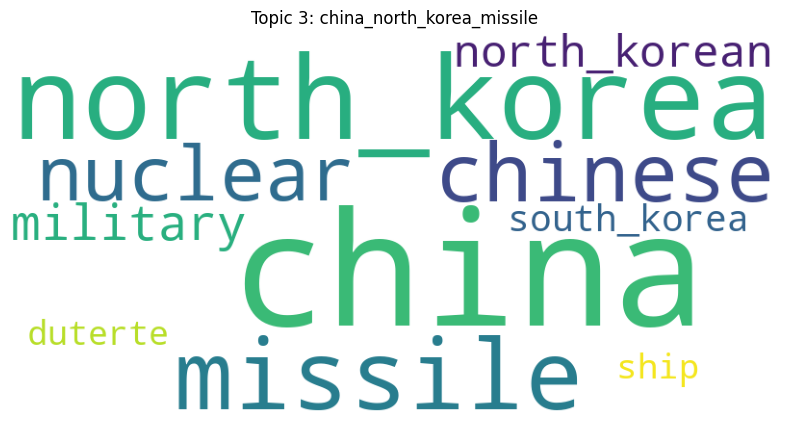

china_north_korea_missile (002): china, north_korea, missile, chinese, nuclear, military, north_korean, south_korea, ship, duterte


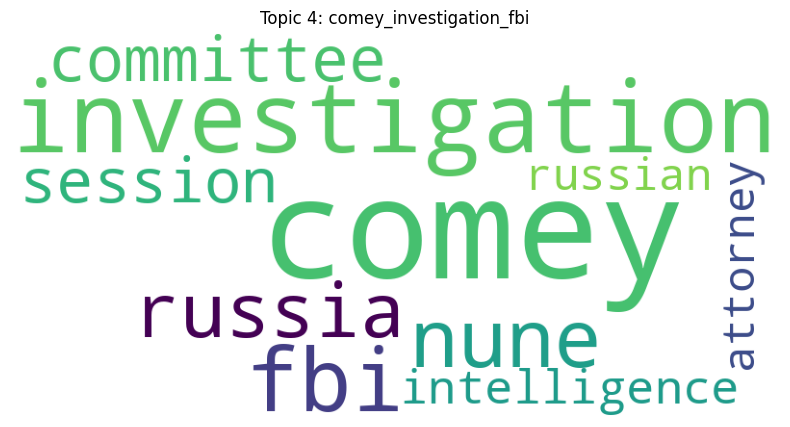

comey_investigation_fbi (003): comey, investigation, fbi, nune, russia, committee, session, intelligence, attorney, russian


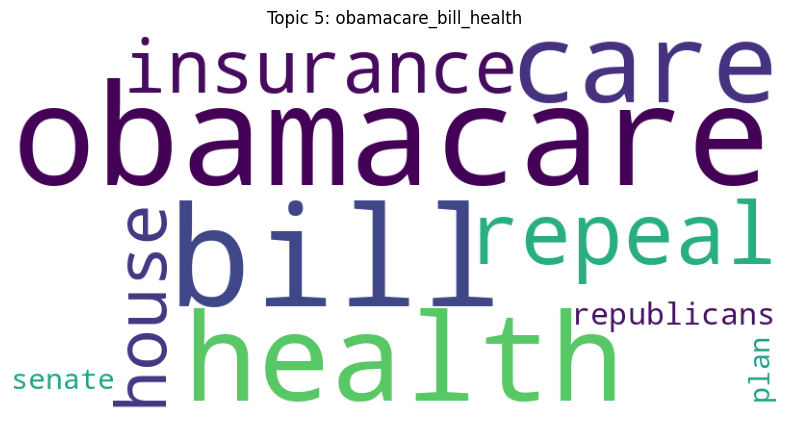

obamacare_bill_health (004): obamacare, bill, health, care, repeal, insurance, house, republicans, senate, plan


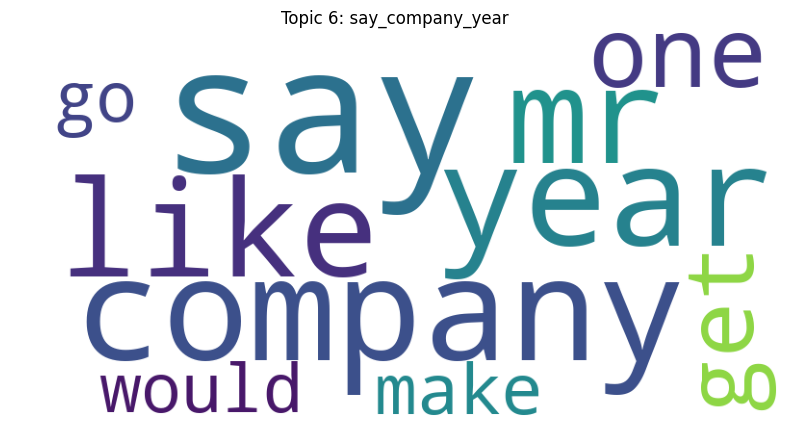

say_company_year (005): say, company, year, mr, like, one, get, make, go, would


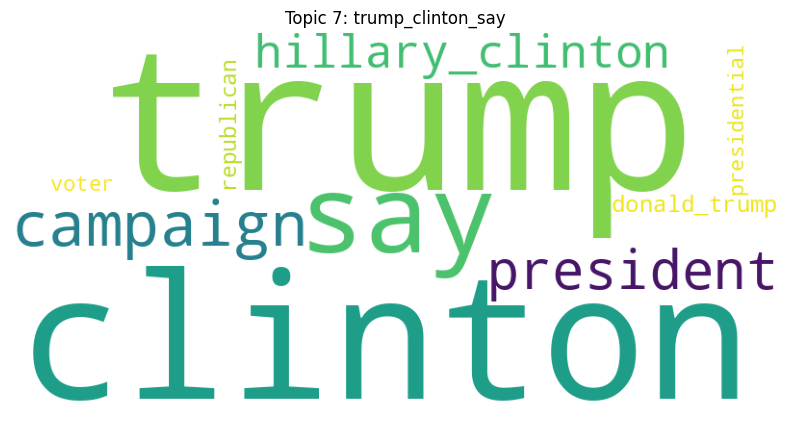

trump_clinton_say (006): trump, clinton, say, campaign, president, hillary_clinton, donald_trump, republican, presidential, voter


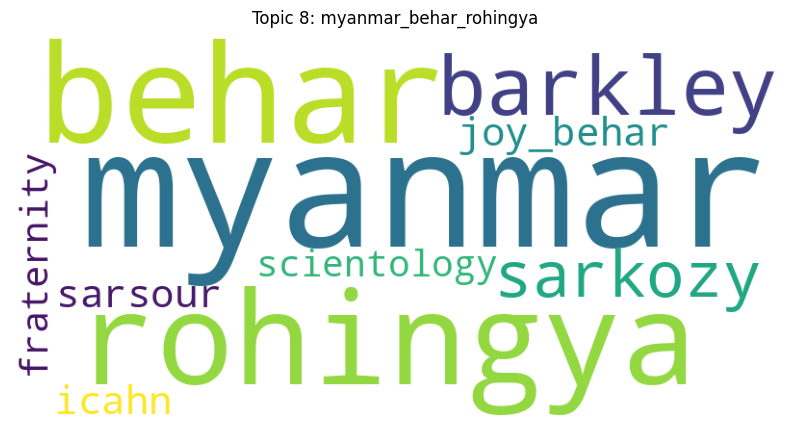

myanmar_behar_rohingya (007): myanmar, behar, rohingya, barkley, sarkozy, joy_behar, sarsour, icahn, fraternity, scientology


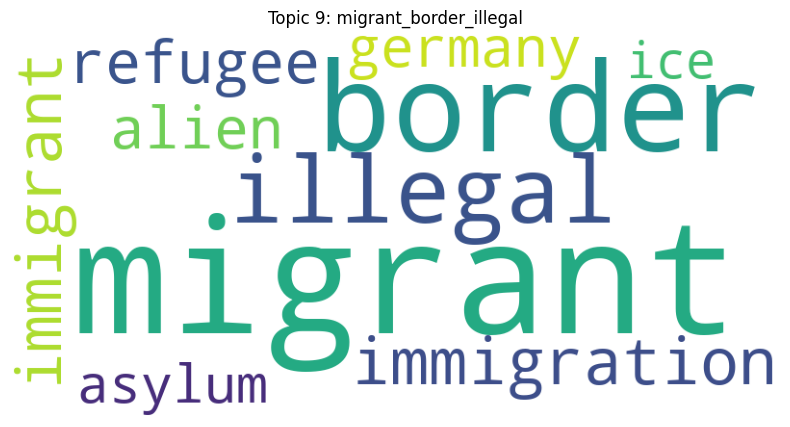

migrant_border_illegal (008): migrant, border, illegal, immigration, immigrant, refugee, alien, germany, asylum, ice


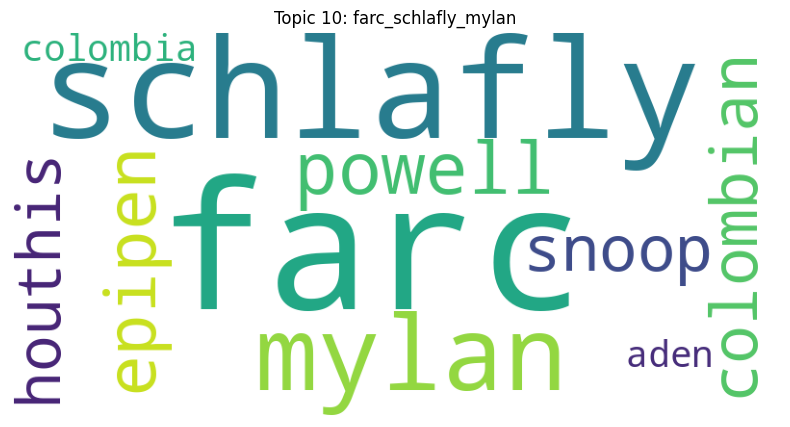

farc_schlafly_mylan (009): farc, schlafly, mylan, powell, epipen, colombian, snoop, houthis, colombia, aden


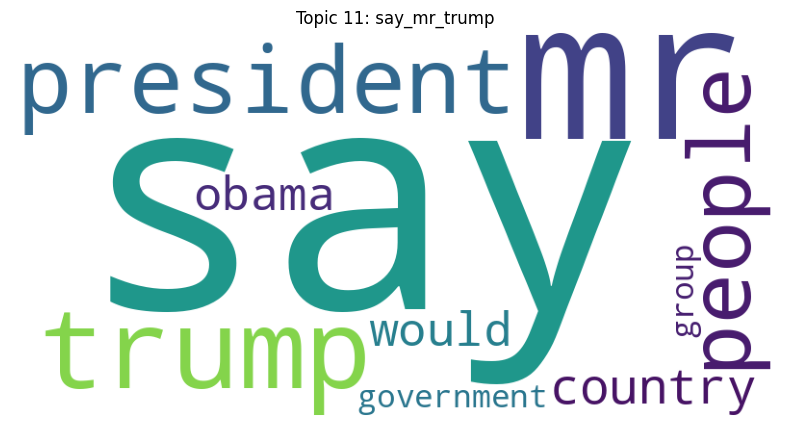

say_mr_trump (010): say, mr, trump, president, people, country, obama, would, government, group


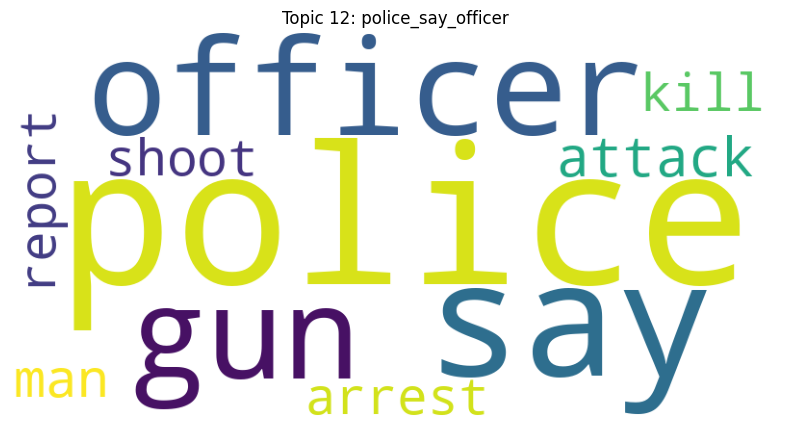

police_say_officer (011): police, say, officer, gun, attack, man, kill, arrest, report, shoot


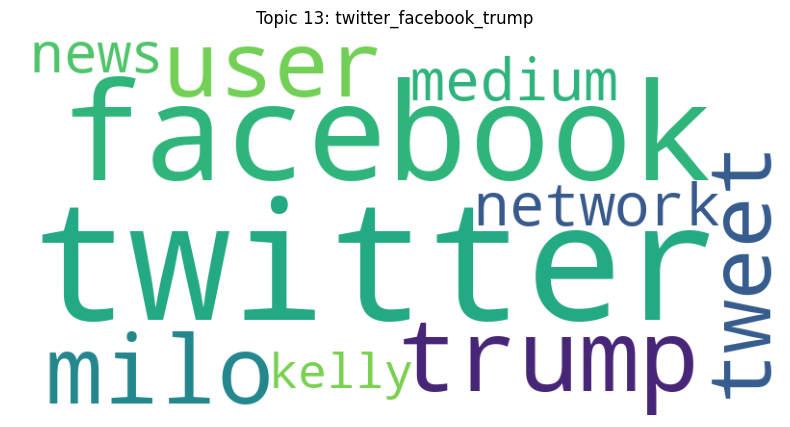

twitter_facebook_trump (012): twitter, facebook, trump, milo, user, tweet, network, medium, news, kelly


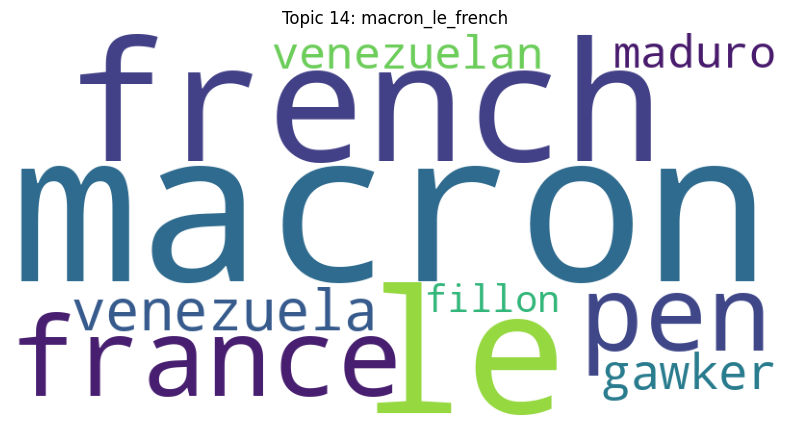

macron_le_french (013): macron, le, french, france, pen, venezuela, gawker, venezuelan, maduro, fillon


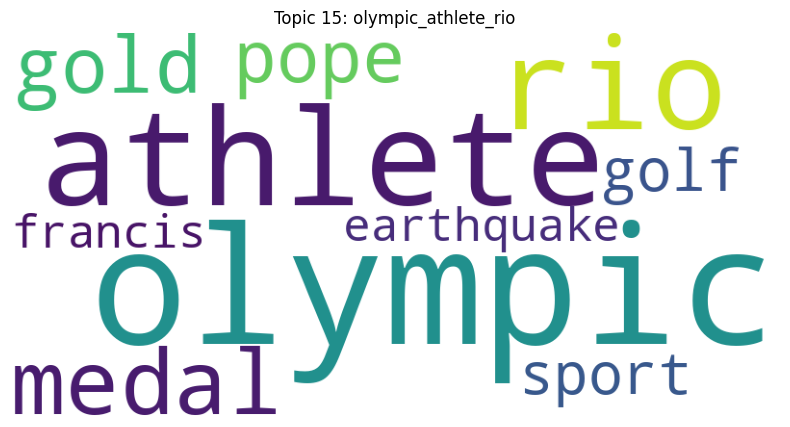

olympic_athlete_rio (014): olympic, athlete, rio, medal, gold, pope, golf, sport, earthquake, francis


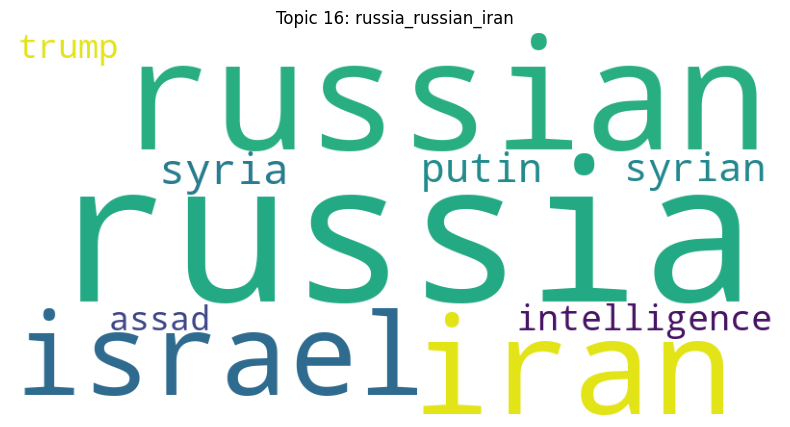

russia_russian_iran (015): russia, russian, iran, israel, syria, putin, syrian, intelligence, assad, trump


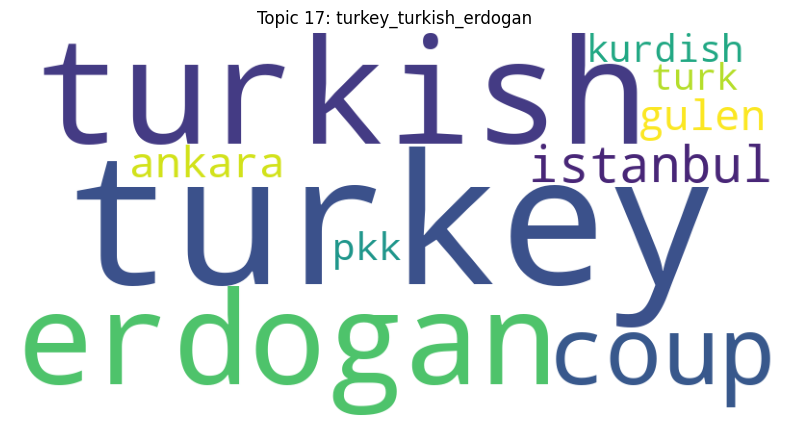

turkey_turkish_erdogan (016): turkey, turkish, erdogan, coup, istanbul, ankara, gulen, pkk, kurdish, turk


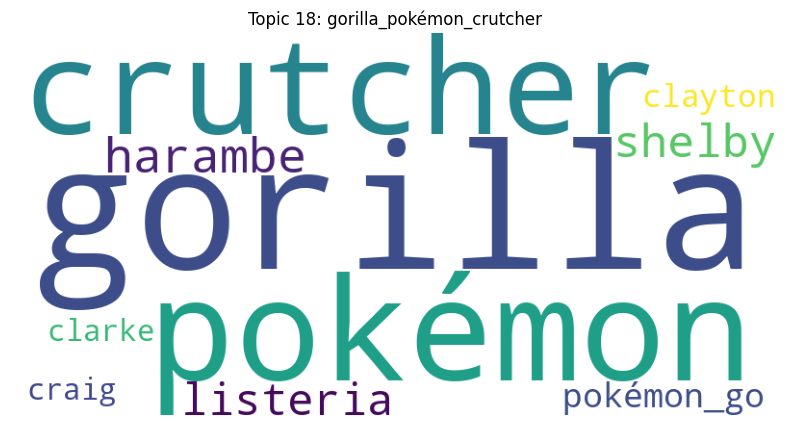

gorilla_pokémon_crutcher (017): gorilla, pokémon, crutcher, harambe, shelby, listeria, pokémon_go, clayton, clarke, craig


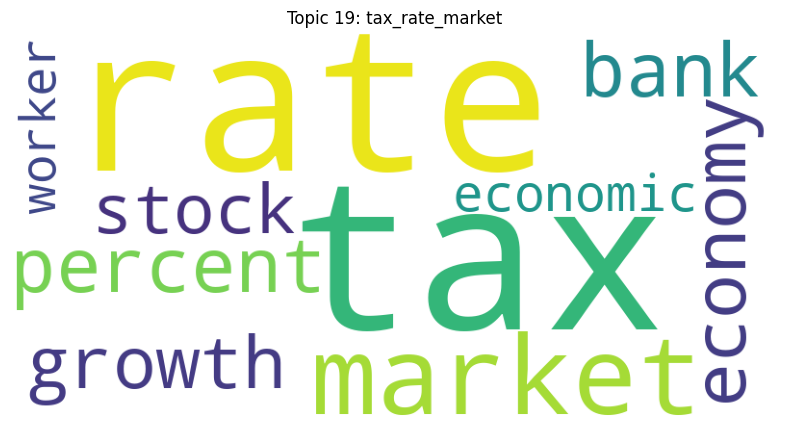

tax_rate_market (018): tax, rate, market, percent, bank, economy, growth, stock, economic, worker


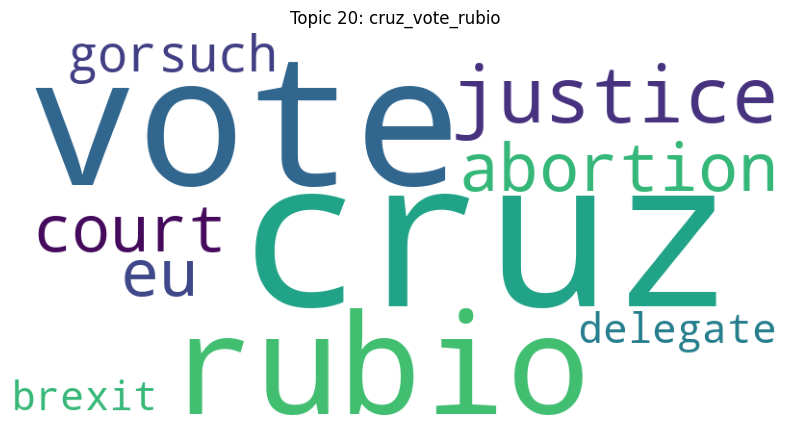

cruz_vote_rubio (019): cruz, vote, rubio, justice, abortion, eu, court, gorsuch, delegate, brexit

Evaluation Metrics:
- Coherence (c_v): 0.590
- Diversity: 94.0%
- Exclusivity: 0.976
- Perplexity: 32869.8


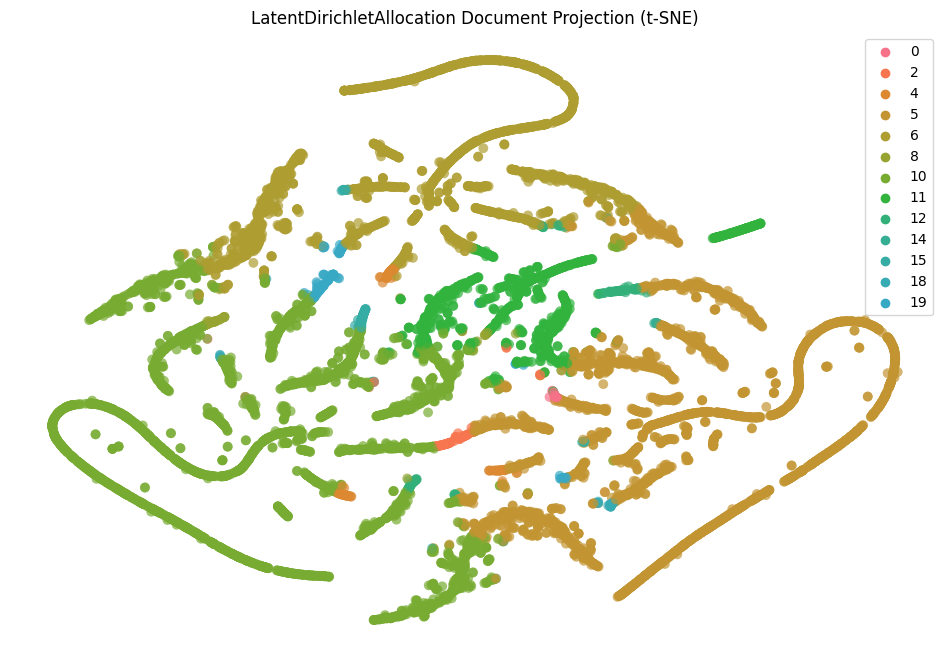


Document Samples:

Topic 1 Documents:
 - one pregnant woman continental united_state confirm zika infection baby brain damage serious birth d...
 - caracas venezuela colombian health official say thursday discover two case microcephaly link zika vi...

Topic 2 Documents:

Topic 3 Documents:
 - seoul south_korea north_korea leader kim say sunday country make final preparation conduct first tes...
 - seoul south_korea less week donald_j._trump taunt north_korea ballistic missile capability north_kor...

Training LSA model
[[ 0.27241224  0.06600183 -0.00740514  0.02019578 -0.15198334  0.03971164
   0.1100537   0.21907432  0.09651219 -0.01500227  0.08763112  0.00050733
  -0.08759721  0.02840741 -0.10024292 -0.05480455  0.08116557  0.00307166
  -0.02507278  0.01812788]]
washington congressional republicans new fear come health care lawsuit obama administration might win incoming trump administration could choose long defend executive branch suit challenge administration authority spend bil

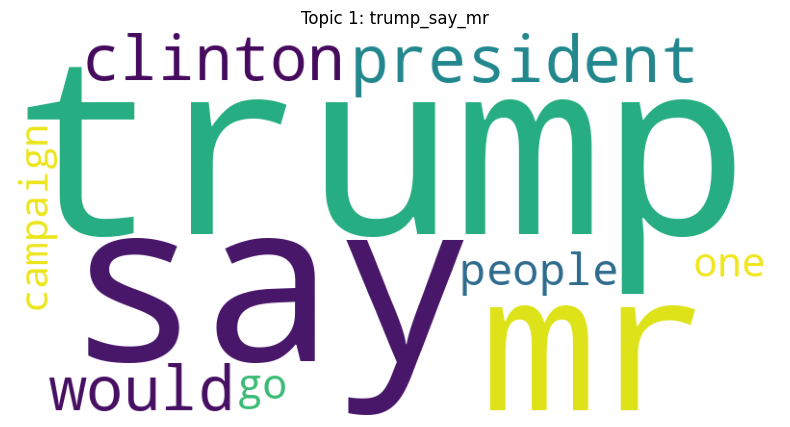

trump_say_mr (000): trump, say, mr, president, clinton, would, people, go, one, campaign


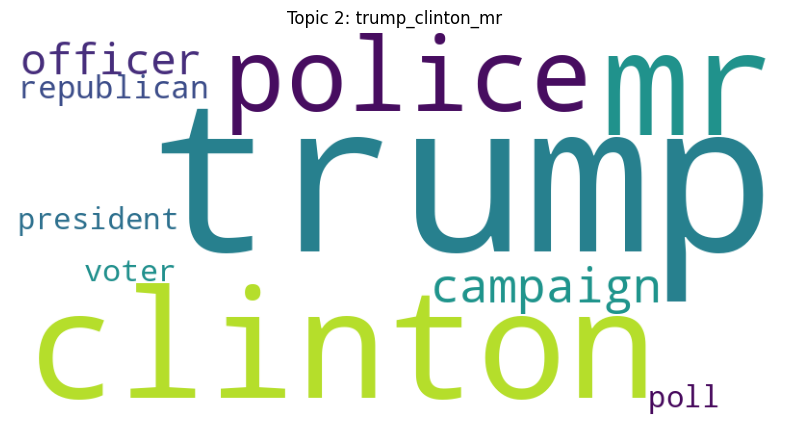

trump_clinton_mr (001): trump, clinton, mr, police, campaign, officer, republican, voter, poll, president


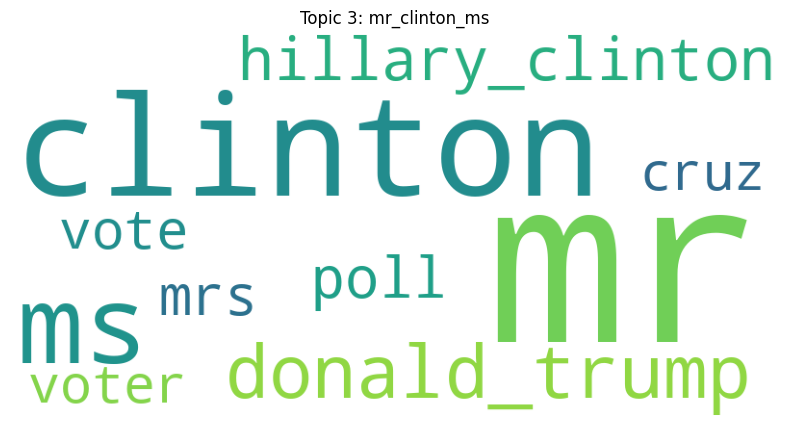

mr_clinton_ms (002): mr, clinton, ms, donald_trump, hillary_clinton, poll, mrs, vote, voter, cruz


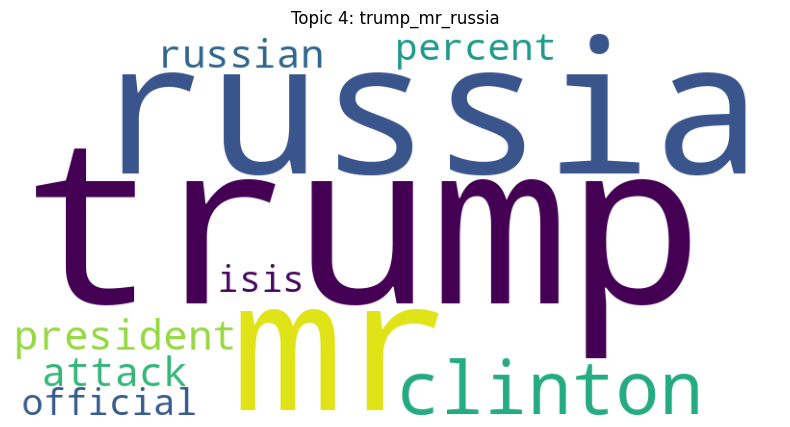

trump_mr_russia (003): trump, mr, russia, clinton, president, attack, russian, percent, isis, official


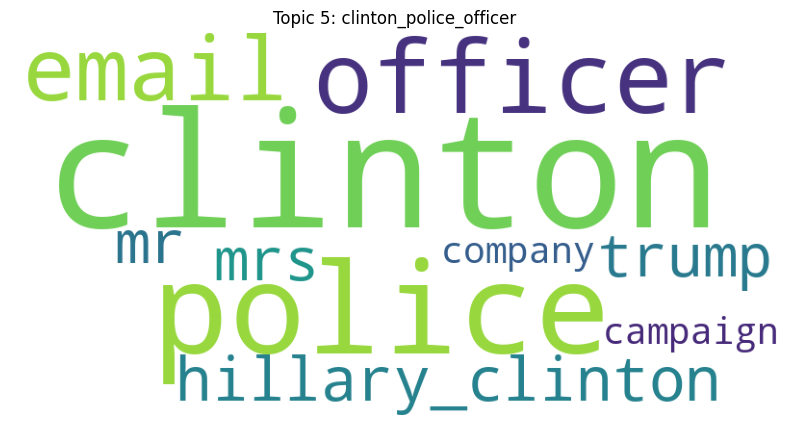

clinton_police_officer (004): clinton, police, officer, email, hillary_clinton, mr, trump, mrs, campaign, company


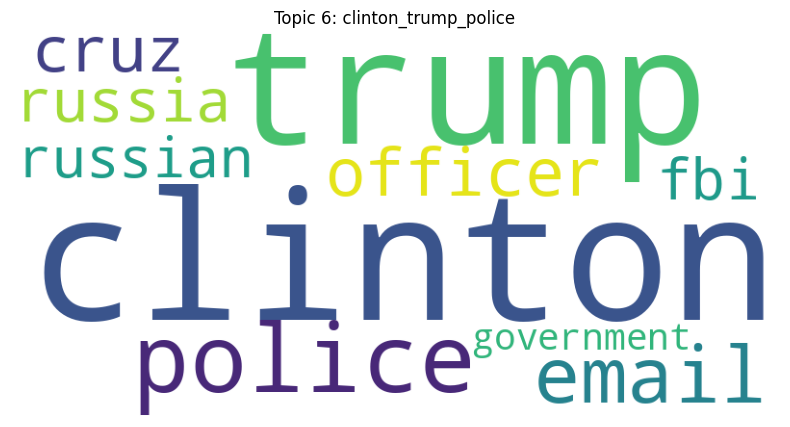

clinton_trump_police (005): clinton, trump, police, email, officer, cruz, russia, fbi, russian, government


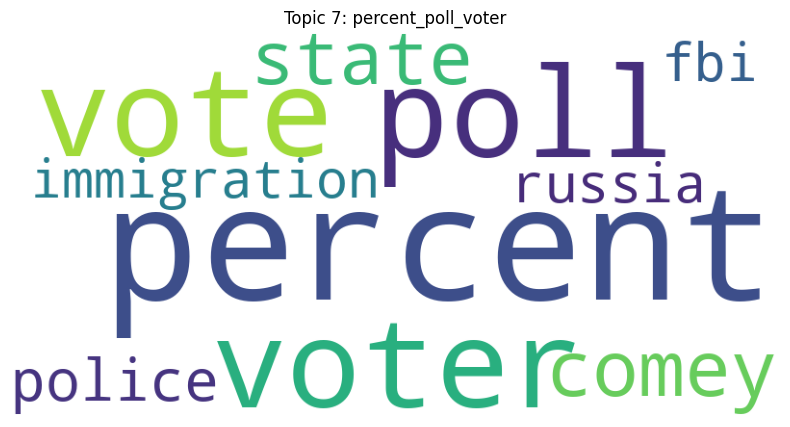

percent_poll_voter (006): percent, poll, voter, vote, comey, state, police, russia, immigration, fbi


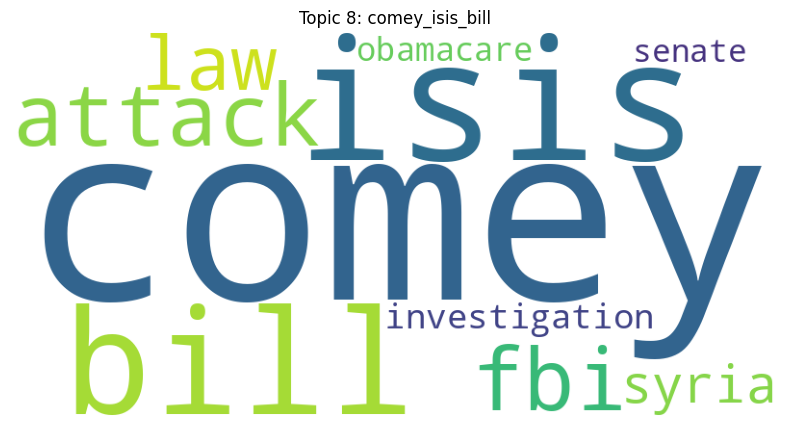

comey_isis_bill (007): comey, isis, bill, attack, fbi, law, syria, investigation, obamacare, senate


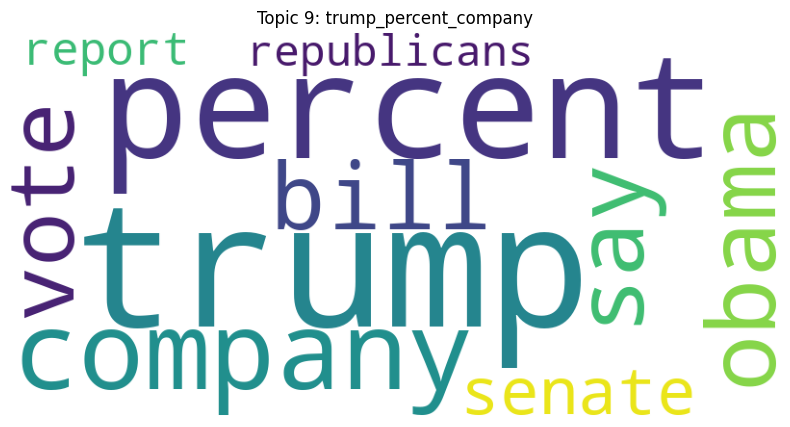

trump_percent_company (008): trump, percent, company, obama, say, bill, vote, senate, report, republicans


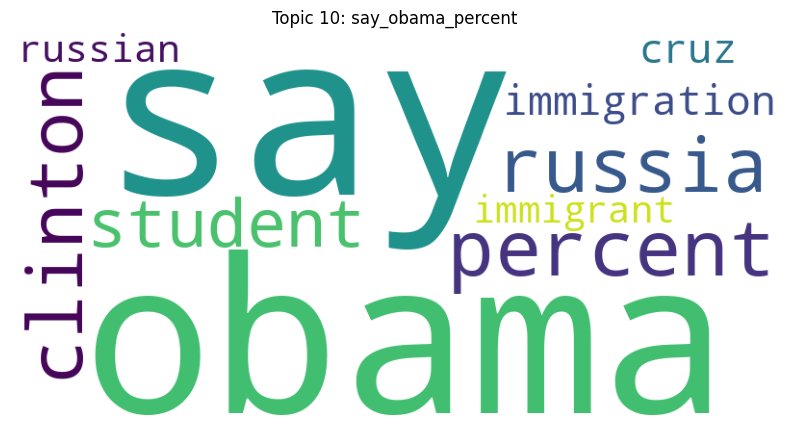

say_obama_percent (009): say, obama, percent, clinton, russia, student, immigration, cruz, russian, immigrant


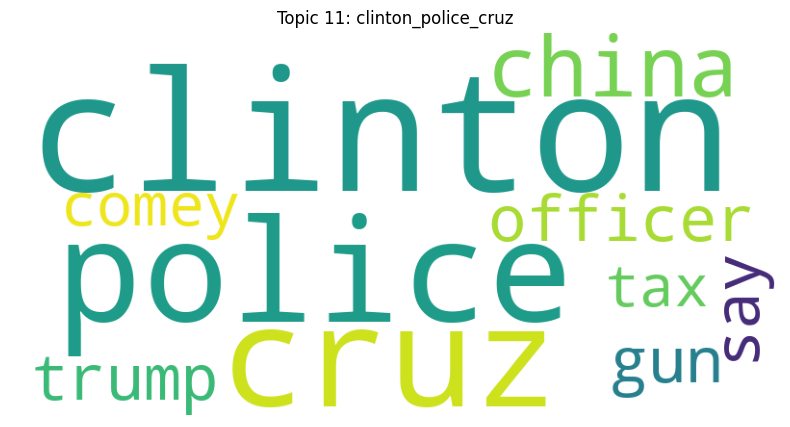

clinton_police_cruz (010): clinton, police, cruz, china, officer, gun, say, trump, comey, tax


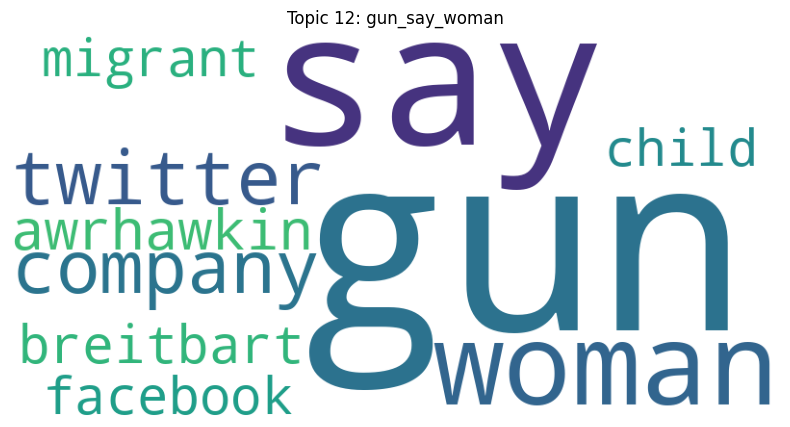

gun_say_woman (011): gun, say, woman, twitter, company, awrhawkin, breitbart, migrant, facebook, child


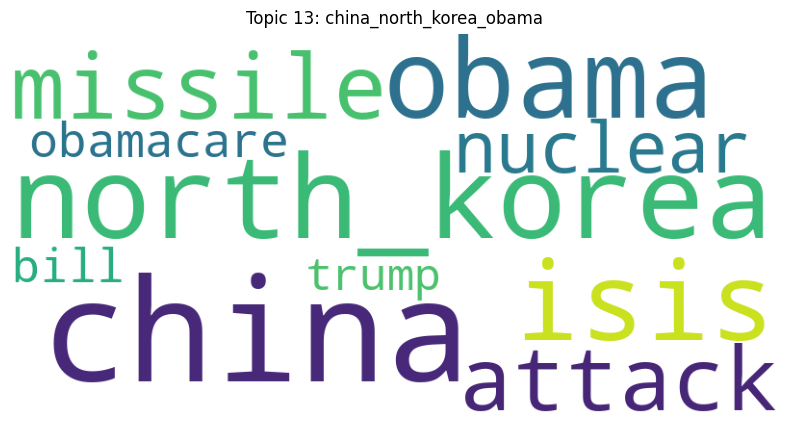

china_north_korea_obama (012): china, north_korea, obama, isis, missile, attack, nuclear, obamacare, bill, trump


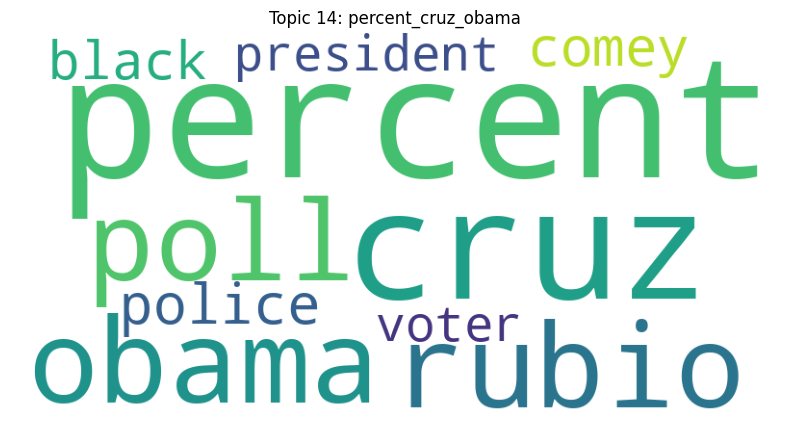

percent_cruz_obama (013): percent, cruz, obama, rubio, poll, police, comey, black, president, voter


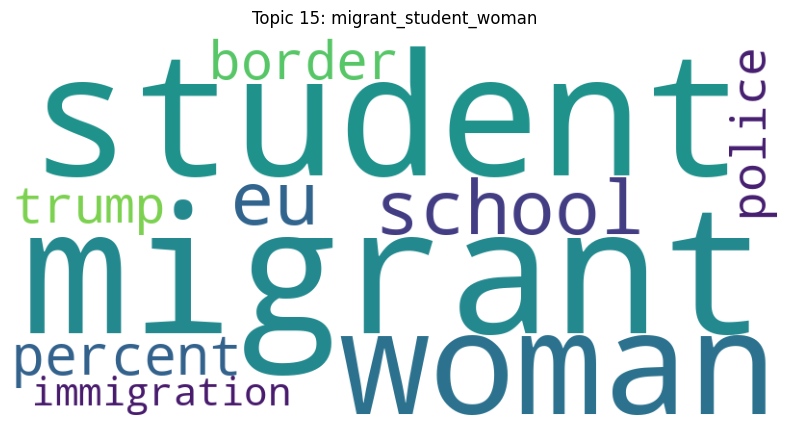

migrant_student_woman (014): migrant, student, woman, school, eu, percent, border, trump, police, immigration


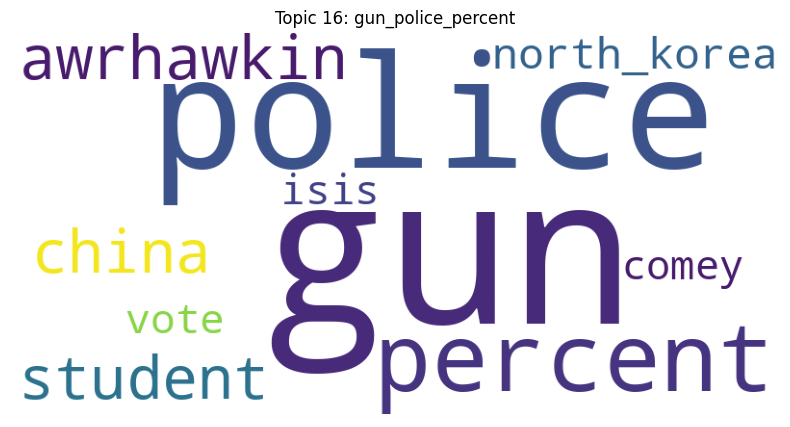

gun_police_percent (015): gun, police, percent, awrhawkin, china, student, north_korea, isis, vote, comey


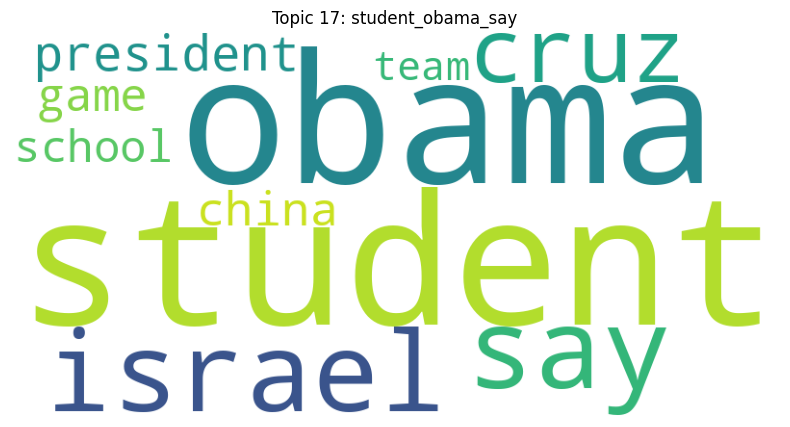

student_obama_say (016): student, obama, say, israel, cruz, president, china, game, school, team


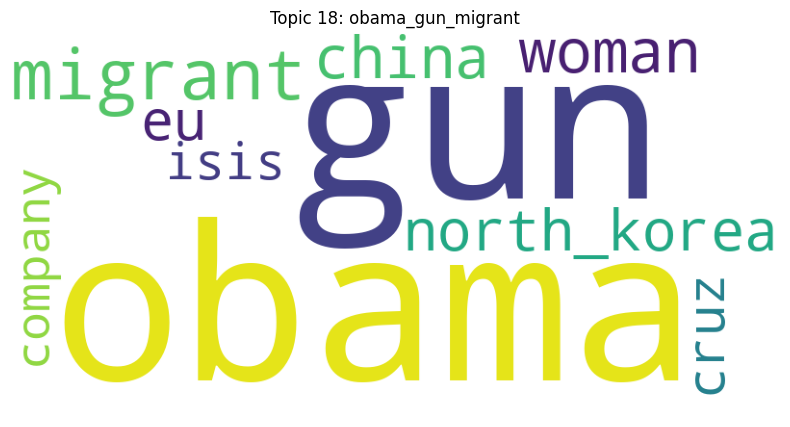

obama_gun_migrant (017): obama, gun, migrant, woman, china, north_korea, eu, cruz, isis, company


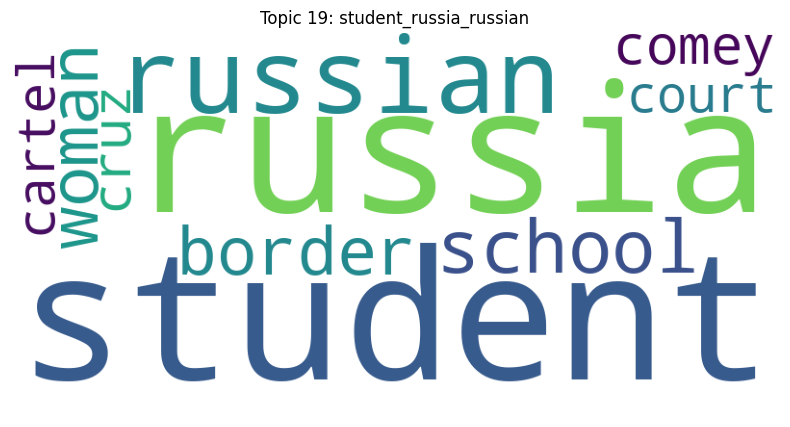

student_russia_russian (018): student, russia, russian, school, woman, border, comey, cruz, cartel, court


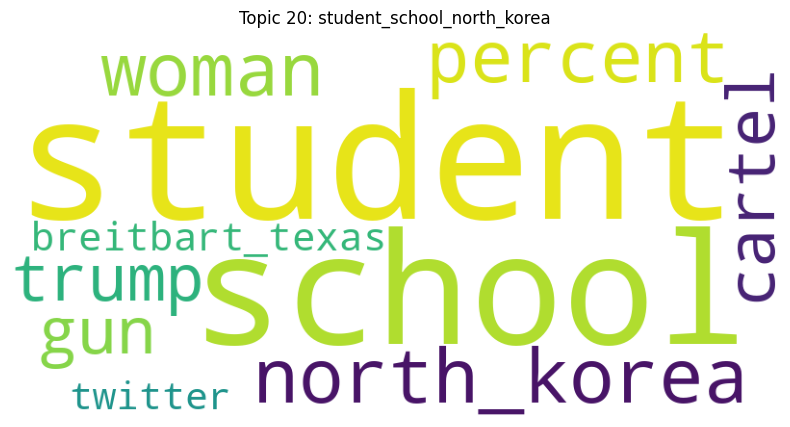

student_school_north_korea (019): student, school, north_korea, woman, percent, cartel, gun, trump, breitbart_texas, twitter

Evaluation Metrics:
- Coherence (c_v): 0.384
- Diversity: 34.5%
- Exclusivity: 0.589


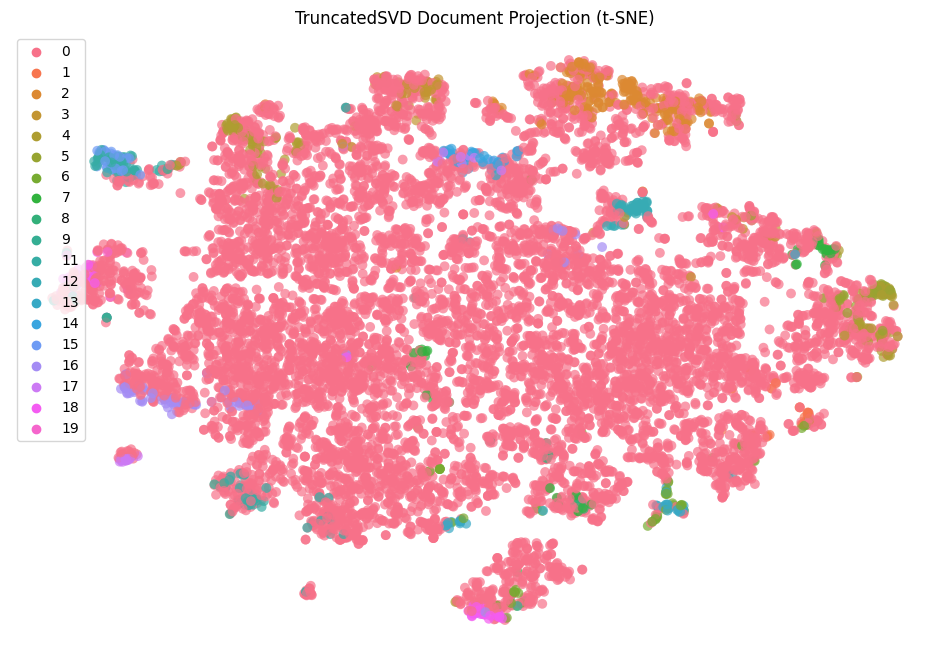


Document Samples:

Topic 1 Documents:
 - washington congressional republicans new fear come health care lawsuit obama administration might wi...
 - bullet shell get count blood dry votive candle burn people peer window see crime scene go cold band ...

Topic 2 Documents:
 - hillary_clinton adviser talk donald_j._trump ghostwriter art deal seek insight mr . trump deep insec...
 - three month november election voter new_hampshire long one purple swing state presidential election ...

Topic 3 Documents:
 - walt_disney bambi open critic praise spare haunt visual style vastly different anything disney do kn...
 - hillary_kerr founder digital medium company los_angeles tell song play five year ago jukebox bar som...

Training KMeans model
[[1.0776123  0.98066276 0.99297816 1.022081   1.0151756  0.99050736
  1.0090039  0.96288824 0.9124544  0.9807879  0.99161863 0.9666284
  1.0327389  1.0048865  1.0077276  1.0103835  1.0315108  0.9812449
  1.0277048  1.0402548 ]]
washington congressional rep

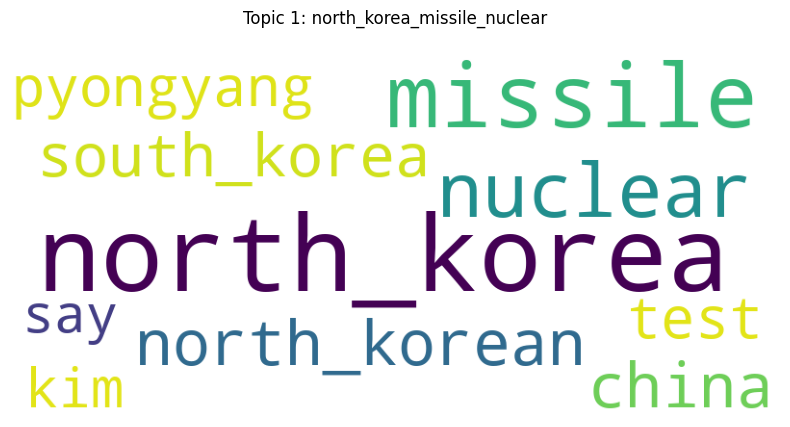

north_korea_missile_nuclear (000): north_korea, missile, nuclear, north_korean, china, south_korea, test, pyongyang, kim, say


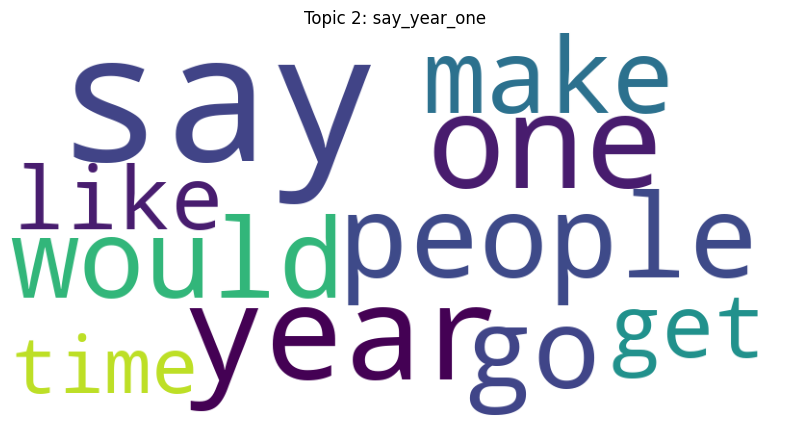

say_year_one (001): say, year, one, people, go, would, make, like, get, time


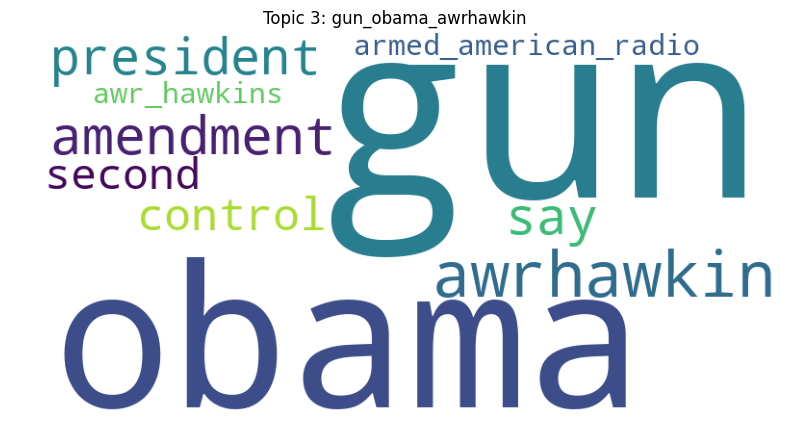

gun_obama_awrhawkin (002): gun, obama, awrhawkin, amendment, say, president, control, second, armed_american_radio, awr_hawkins


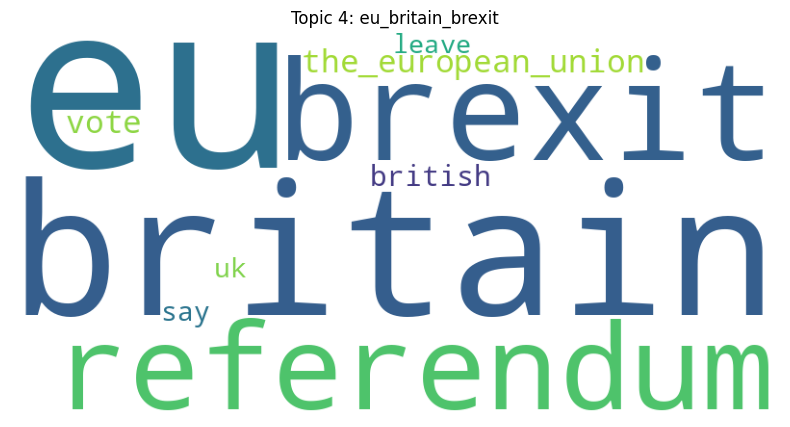

eu_britain_brexit (003): eu, britain, brexit, referendum, the_european_union, vote, british, uk, say, leave


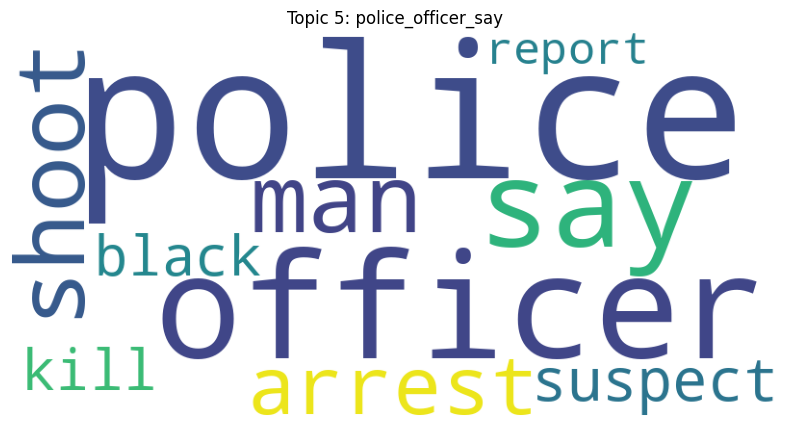

police_officer_say (004): police, officer, say, man, shoot, arrest, suspect, kill, black, report


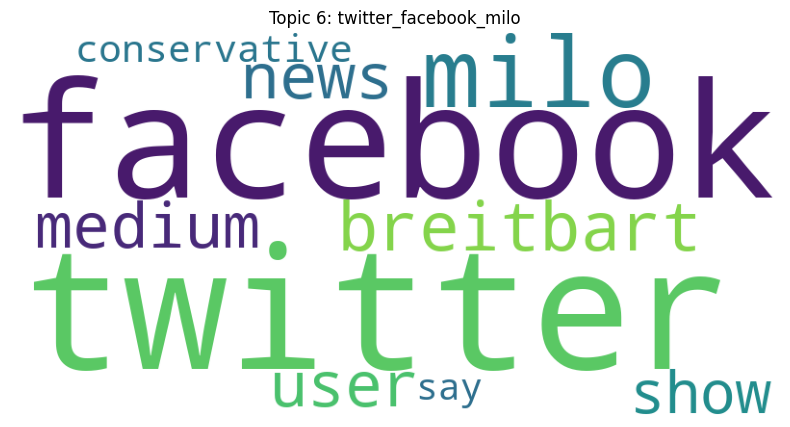

twitter_facebook_milo (005): twitter, facebook, milo, breitbart, news, medium, user, show, conservative, say


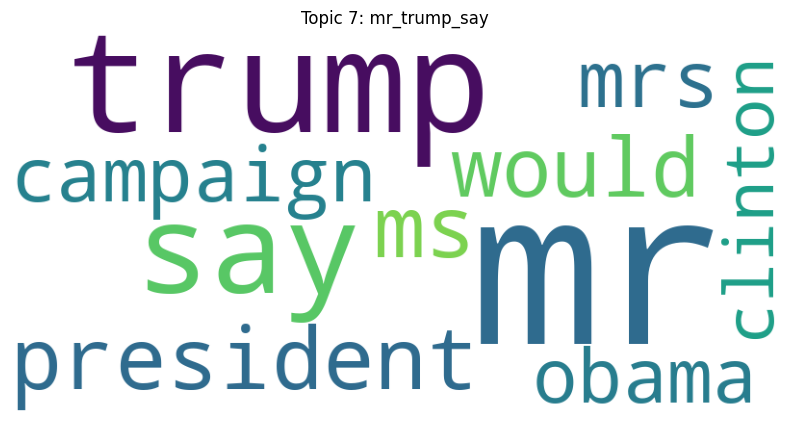

mr_trump_say (006): mr, trump, say, president, ms, would, mrs, campaign, obama, clinton


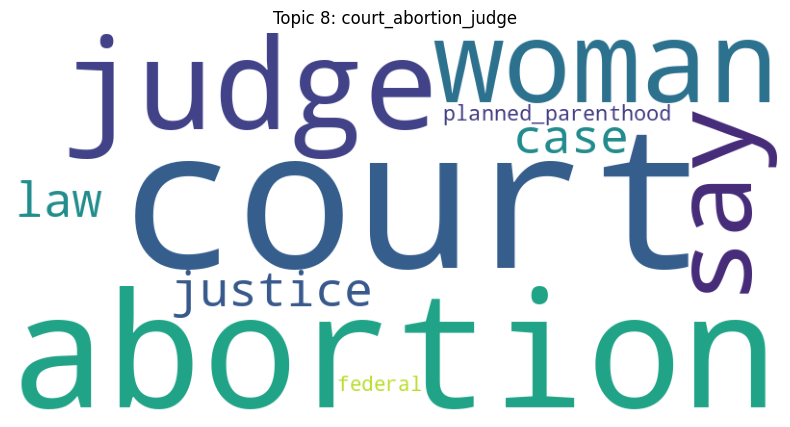

court_abortion_judge (007): court, abortion, judge, woman, say, justice, law, case, planned_parenthood, federal


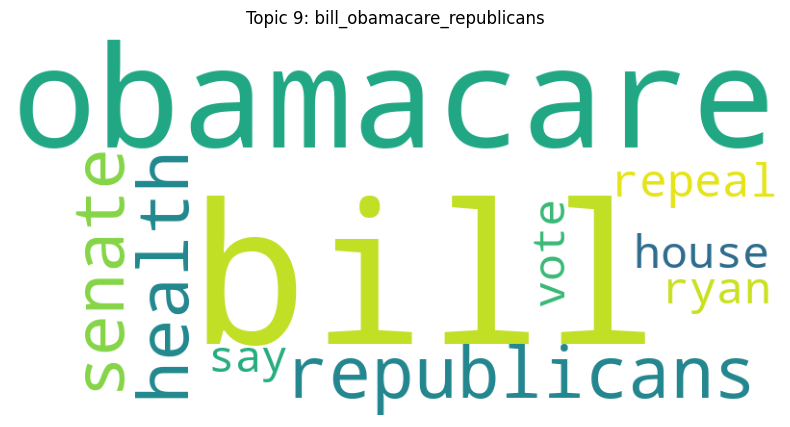

bill_obamacare_republicans (008): bill, obamacare, republicans, health, senate, repeal, house, vote, ryan, say


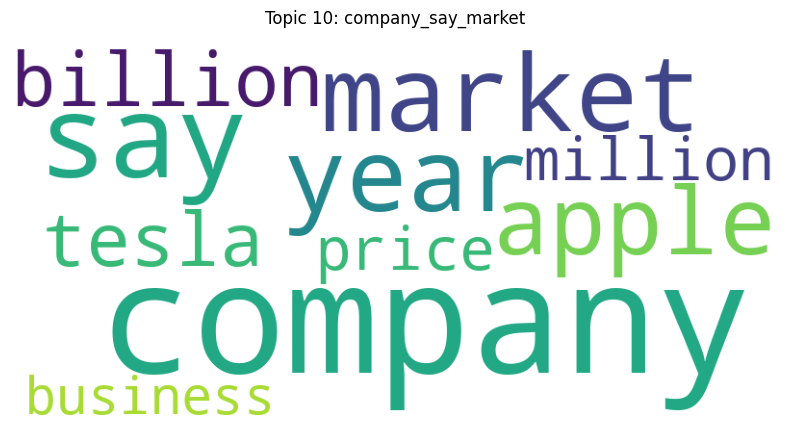

company_say_market (009): company, say, market, year, apple, billion, tesla, million, price, business


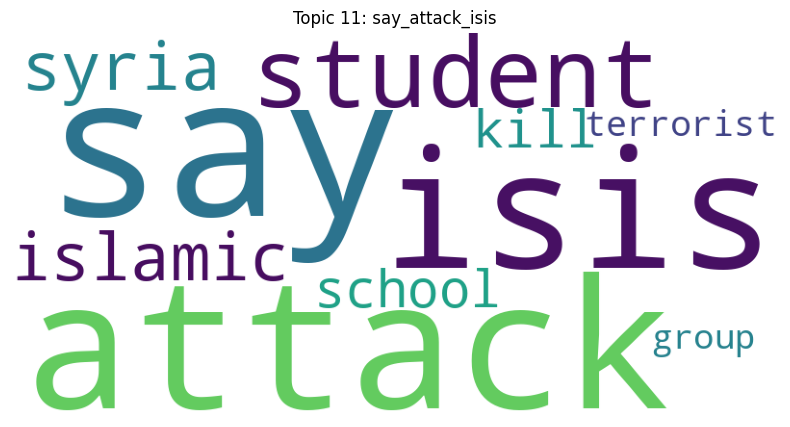

say_attack_isis (010): say, attack, isis, student, islamic, syria, school, kill, terrorist, group


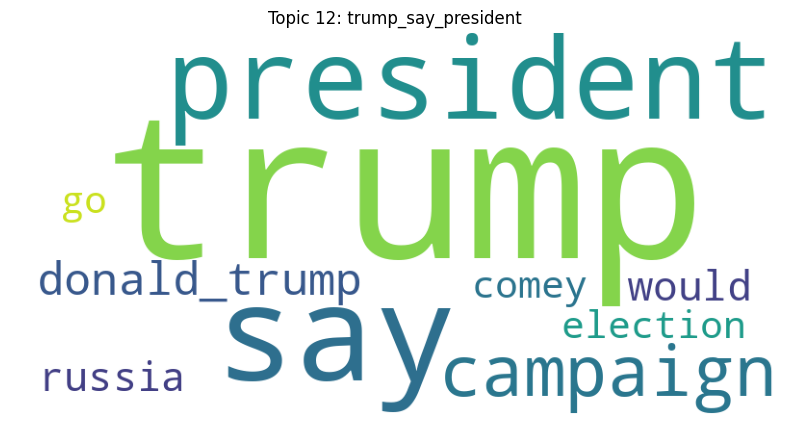

trump_say_president (011): trump, say, president, campaign, donald_trump, would, russia, election, comey, go


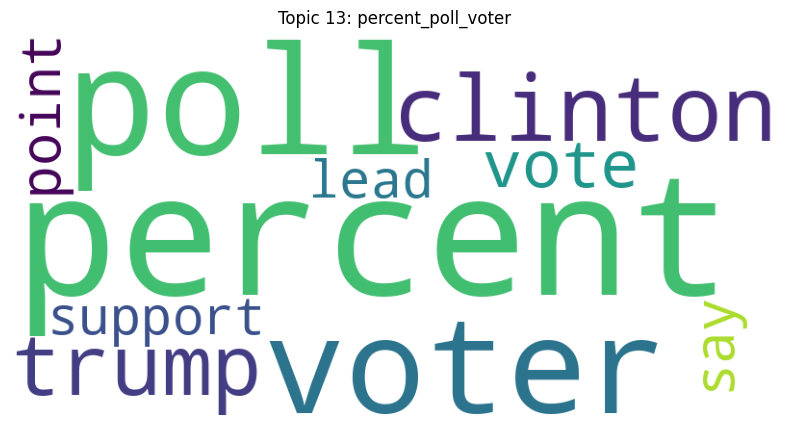

percent_poll_voter (012): percent, poll, voter, clinton, trump, vote, say, point, support, lead


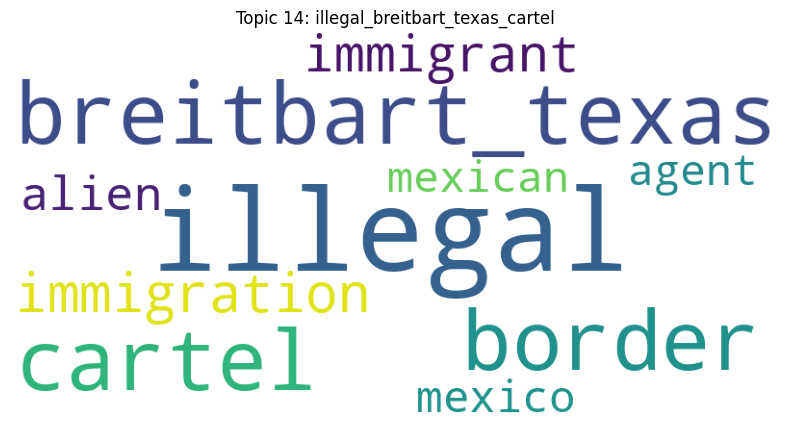

illegal_breitbart_texas_cartel (013): illegal, breitbart_texas, cartel, border, immigration, immigrant, alien, mexico, mexican, agent


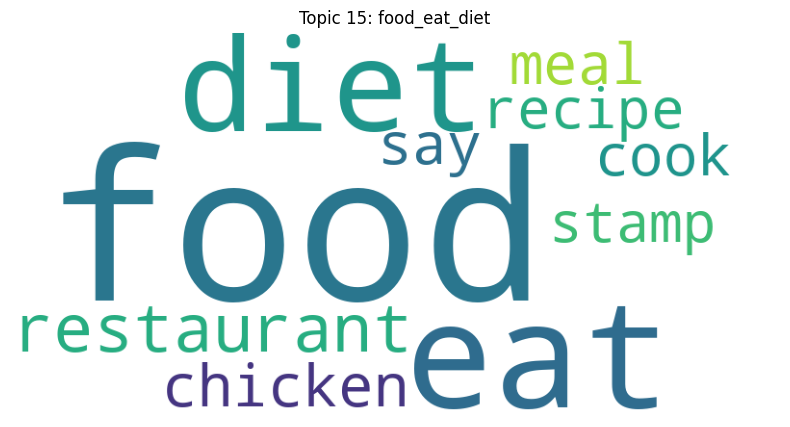

food_eat_diet (014): food, eat, diet, restaurant, chicken, say, cook, meal, stamp, recipe


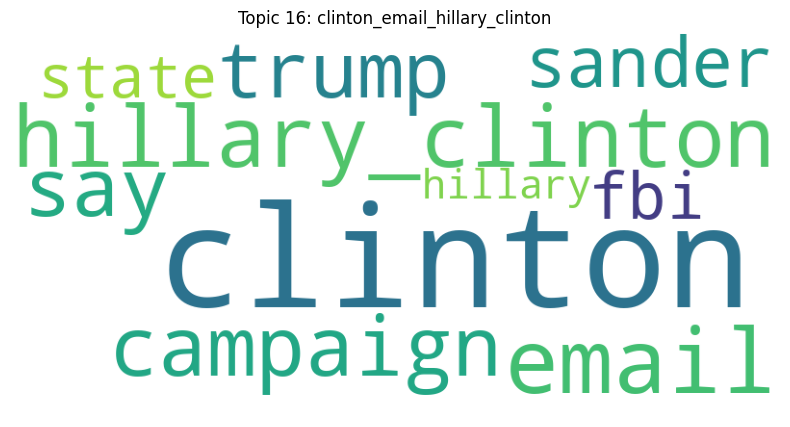

clinton_email_hillary_clinton (015): clinton, email, hillary_clinton, campaign, say, trump, sander, fbi, state, hillary


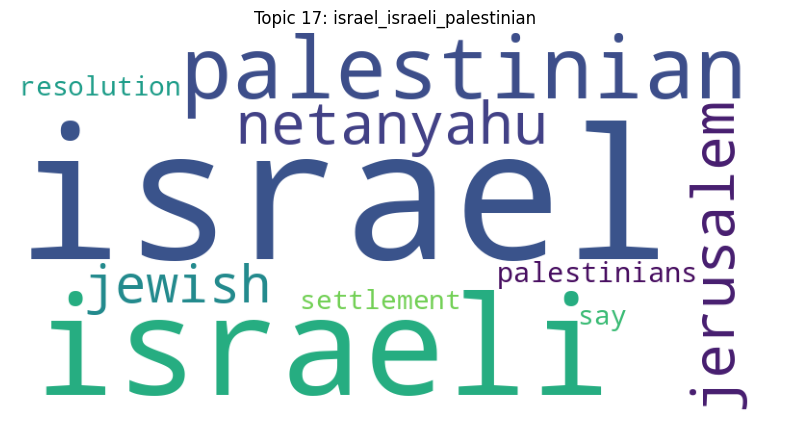

israel_israeli_palestinian (016): israel, israeli, palestinian, netanyahu, jerusalem, jewish, palestinians, say, resolution, settlement


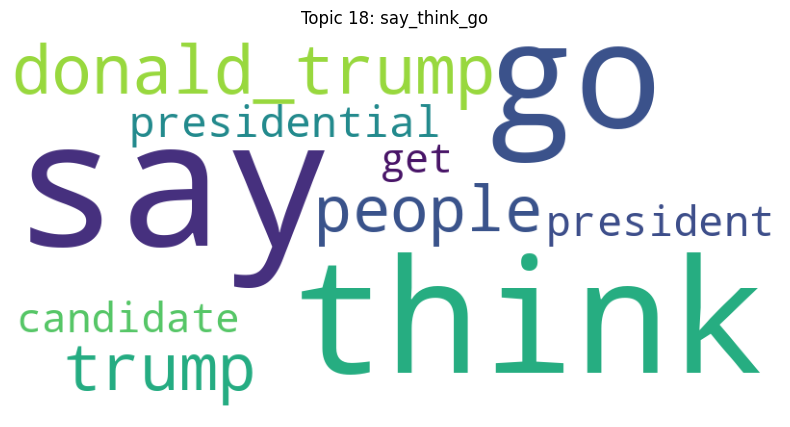

say_think_go (017): say, think, go, donald_trump, trump, people, presidential, president, candidate, get


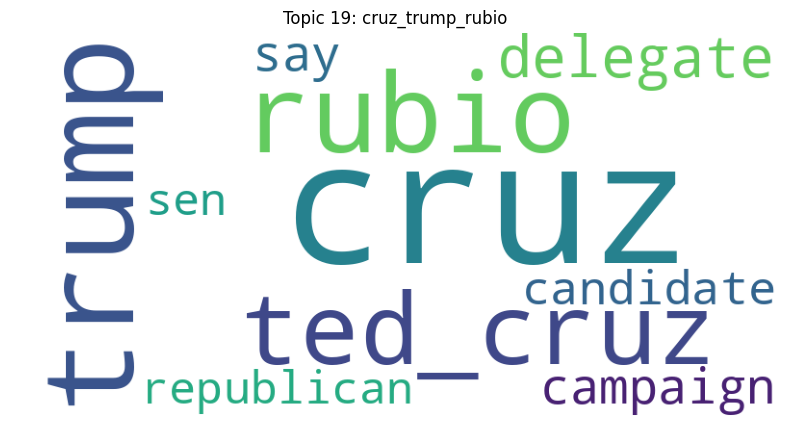

cruz_trump_rubio (018): cruz, trump, rubio, ted_cruz, delegate, say, campaign, candidate, sen, republican


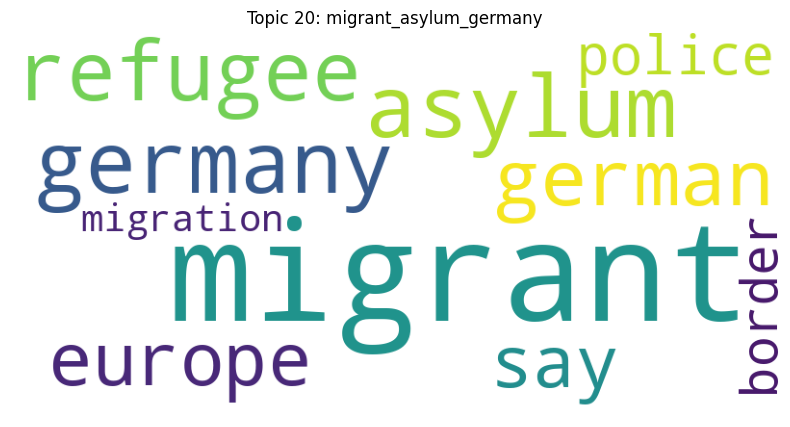

migrant_asylum_germany (019): migrant, asylum, germany, refugee, german, europe, say, police, border, migration

Evaluation Metrics:
- Coherence (c_v): 0.642
- Diversity: 77.0%
- Exclusivity: 0.932
- Silhouette Score: 0.008


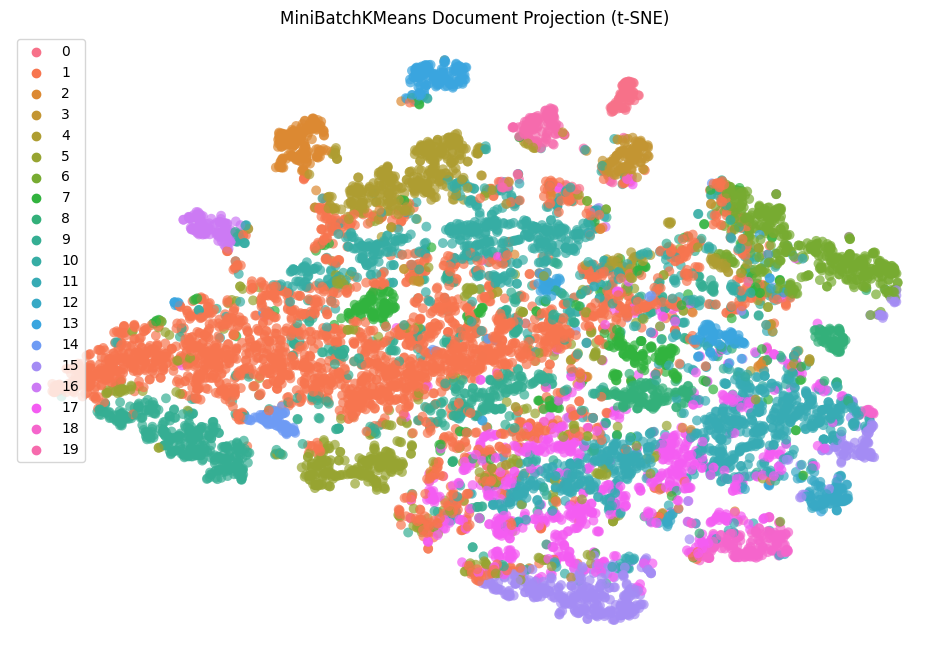


Document Samples:

Topic 1 Documents:
 - washington congressional republicans new fear come health care lawsuit obama administration might wi...
 - bullet shell get count blood dry votive candle burn people peer window see crime scene go cold band ...

Topic 2 Documents:

Topic 3 Documents:

Training Agglomerative model


TypeError: A sparse matrix was passed, but dense data is required. Use X.toarray() to convert to a dense numpy array.

In [83]:
from sklearn.decomposition import NMF, LatentDirichletAllocation, TruncatedSVD
from sklearn.cluster import MiniBatchKMeans
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from gensim.models import CoherenceModel
from gensim.corpora import Dictionary
from collections import defaultdict
from sklearn.decomposition import NMF, LatentDirichletAllocation, TruncatedSVD
from sklearn.cluster import MiniBatchKMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from bertopic import BERTopic  # Requires pip install bertopic

# Usage example
feature_names = tfidf_vectorizer.get_feature_names_out()

models = {
    # Topic Modeling
    'NMF': NMF(n_components=20, random_state=42),
    'LDA': LatentDirichletAllocation(n_components=20, random_state=42),
    'LSA': TruncatedSVD(n_components=20, random_state=42),  # Latent Semantic Analysis
    
    # Clustering (Hard & Soft)
    'KMeans': MiniBatchKMeans(n_clusters=20, random_state=42),
}

# You need to prepare these inputs for full evaluation
tokenized_docs = [doc.split() for doc in lemmatized_text]  # List of word lists
documents = lemmatized_text  # Original text documents

for name, model in models.items():
    print(f"\n{'='*40}\nTraining {name} model\n{'='*40}")
    model.fit(tfidf_matrix)
    print(model.transform(tfidf_matrix[0]))
    print(lemmatized_text[0])

    display_topics(
        model=model,
        feature_names=feature_names,
        tfidf_matrix=tfidf_matrix,
        tokenized_docs=tokenized_docs,
        documents=documents,
        verbose=True
    )

In [86]:
import pickle
for name, model in models.items():
    pickle.dump(model, open(f'{name}_model.pkl', 'wb'))

In [87]:
pickle.dump(tfidf_vectorizer, open('tfidf_model.pkl', 'wb'))

In [ ]:
while True:
    pass

In [ ]:
# model = pickle.load(open('nmf_model.pkl', 'rb'))
# print(model.transform(tfidf_matrix[0]))
# print(lemmatized_text[0])

In [ ]:
# from sklearn.decomposition import NMF, LatentDirichletAllocation, TruncatedSVD
# from sklearn.cluster import MiniBatchKMeans
# from sklearn.manifold import TSNE
# from wordcloud import WordCloud
# import matplotlib.pyplot as plt
# import seaborn as sns
# import numpy as np

# def display_topics(model, feature_names, tfidf_matrix=None, 
#                   num_top_words=10, verbose=True, max_docs=1000):
#     """
#     Display topics with visualization (word clouds + document projection)
#     """
#     model_name = model.__class__.__name__
#     print(f"\n{model_name} Results:")
    
#     # Generate consistent colors for topics/clusters
#     n_topics = len(model.components_) if hasattr(model, 'components_') else len(model.cluster_centers_)
#     palette = sns.color_palette("husl", n_topics)
    
#     # Word Cloud Generation
#     def create_wordcloud(weights, title):
#         word_freq = {feature_names[i]: weights[i] for i in np.argsort(weights)[-num_top_words:]}
#         wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)
#         plt.figure(figsize=(10, 5))
#         plt.imshow(wordcloud)
#         plt.title(title)
#         plt.axis("off")
#         plt.show()
    
#     # Document Projection Visualization
#     def visualize_projection():
#         try:
#             if tfidf_matrix is None:
#                 return
                
#             # Subsample if too many documents
#             if tfidf_matrix.shape[0] > max_docs:
#                 indices = np.random.choice(tfidf_matrix.shape[0], max_docs, replace=False)
#                 matrix_sample = tfidf_matrix[indices]
#             else:
#                 matrix_sample = tfidf_matrix
                
#             # Get document representations
#             if hasattr(model, 'transform'):
#                 doc_representation = model.transform(matrix_sample)
#             else:  # For clustering models
#                 doc_representation = model.predict_proba(matrix_sample)
                
#             # Reduce dimensionality
#             tsne = TSNE(n_components=2, perplexity=30, random_state=42)
#             embeddings = tsne.fit_transform(doc_representation)
            
#             # Get labels for coloring
#             if hasattr(model, 'components_'):
#                 labels = np.argmax(doc_representation, axis=1)
#             else:
#                 labels = model.predict(matrix_sample)
            
#             # Plot
#             plt.figure(figsize=(12, 8))
#             sns.scatterplot(x=embeddings[:,0], y=embeddings[:,1], 
#                            hue=labels, palette=palette, 
#                            alpha=0.7, s=50, edgecolor='none')
#             plt.title(f"{model_name} Document Projection (t-SNE)")
#             plt.axis('off')
#             plt.show()
            
#         except Exception as e:
#             print(f"Visualization error: {str(e)}")

#     # Main logic
#     components = []
#     entries = []
    
#     if hasattr(model, 'components_'):
#         components = np.abs(model.components_) if isinstance(model, TruncatedSVD) else model.components_
#     elif hasattr(model, 'cluster_centers_'):
#         components = model.cluster_centers_
    
#     for idx, comp in enumerate(components):
#         # Get top words
#         top_indices = np.argsort(comp)[-num_top_words:][::-1]
#         top_words = [feature_names[i] for i in top_indices]
#         entry = "_".join(top_words[:3])[:30]
#         entries.append(entry)
        
#         if verbose:
#             # Show word cloud for each topic
#             create_wordcloud(comp, f"Topic {idx+1}: {entry}")
#             print(f"{entry} ({idx:03d}): {', '.join(top_words)}")
    
#     # Show document projection
#     if verbose and tfidf_matrix is not None:
#         visualize_projection()
    
#     if not verbose:
#         print(f"Top {num_top_words} topics: {', '.join(entries[:5])}...")

# # Usage example
# feature_names = tfidf_vectorizer.get_feature_names_out()
# models = {
#     'NMF': NMF(n_components=20, random_state=42),
#     'LSA': TruncatedSVD(n_components=20, random_state=42),
#     'KMeans': MiniBatchKMeans(n_clusters=20, random_state=42)
# }

# for name, model in models.items():
#     model.fit(tfidf_matrix)
#     display_topics(model, feature_names, tfidf_matrix, verbose=True)

In [ ]:
# from sklearn.decomposition import NMF, LatentDirichletAllocation, TruncatedSVD
# from sklearn.cluster import MiniBatchKMeans
# from tqdm.auto import tqdm
# from wordcloud import WordCloud
# import matplotlib.pyplot as plt

# def train_topic_model(matrix, model_type='nmf', num_components=20, max_iter=100, verbose=True):
#     """
#     Train topic models with progress tracking
#     Types: 'nmf', 'lda', 'lsa', 'kmeans'
#     """
#     models = {
#         'nmf': NMF(n_components=num_components, max_iter=max_iter, 
#                  random_state=42, verbose=verbose),
#         'lda': LatentDirichletAllocation(n_components=num_components, 
#                        max_iter=max_iter, random_state=42, verbose=verbose),
#         'lsa': TruncatedSVD(n_components=num_components, 
#                       random_state=42, algorithm='arpack'),
#         'kmeans': MiniBatchKMeans(n_clusters=num_components, 
#                         max_iter=max_iter, random_state=42, verbose=verbose)
#     }
    
#     with tqdm(total=1, desc=f"Training {model_type.upper()}", disable=not verbose) as pbar:
#         model = models[model_type.lower()]
#         model.fit(matrix)
#         pbar.update(1)
    
#     return model

# def display_topics(model, feature_names, num_top_words=10, verbose=True):
#     """
#     Display topics with optional verbosity and word clouds
#     """
#     model_name = model.__class__.__name__
#     print(f"\n{model_name} Results:")
    
#     def generate_name(words):
#         return "_".join(words[:2]).replace(" ", "")[:20]
    
#     # Word Cloud Generator
#     def create_wordcloud(weights, features, title):
#         word_freq = {features[i]: weights[i] for i in weights.argsort()[-num_top_words:]}
#         wordcloud = WordCloud(width=800, height=400, 
#                             background_color='white').generate_from_frequencies(word_freq)
#         plt.figure(figsize=(10, 5))
#         plt.imshow(wordcloud)
#         plt.title(title)
#         plt.axis("off")
#         plt.show()
    
#     if hasattr(model, 'components_'):
#         components = model.components_
#         for idx, comp in enumerate(components):
#             top_words = [feature_names[i] for i in comp.argsort()[-num_top_words:][::-1]]
#             print(f"Topic {idx+1}: {', '.join(top_words)}")
            
#             if verbose:
#                 create_wordcloud(comp, feature_names, f"Topic {idx+1} Word Cloud")
                
#     elif hasattr(model, 'cluster_centers_'):
#         centers = model.cluster_centers_
#         for idx, center in enumerate(centers):
#             top_words = [feature_names[i] for i in center.argsort()[-num_top_words:][::-1]]
#             print(f"Cluster {idx+1}: {', '.join(top_words)}")
            
#             if verbose:
#                 create_wordcloud(center, feature_names, f"Cluster {idx+1} Word Cloud")

# # Usage example
# feature_names = tfidf_vectorizer.get_feature_names_out()

# # Train and display with word clouds
# nmf_model = train_topic_model(tfidf_matrix, 'nmf', verbose=True)
# display_topics(nmf_model, feature_names, verbose=True)

# # Quick version without visualizations
# kmeans_model = train_topic_model(tfidf_matrix, 'kmeans', verbose=False)
# display_topics(kmeans_model, feature_names, verbose=False)

In [ ]:
# import pandas as pd
# from sklearn.feature_extraction.text import TfidfVectorizer
# from sklearn.decomposition import NMF, LatentDirichletAllocation
# from wordcloud import WordCloud
# import matplotlib.pyplot as plt

# def prepare_data(texts, max_features=5000):
#     """Create TF-IDF matrix from text"""
#     vectorizer = TfidfVectorizer(max_features=max_features)
#     tfidf_matrix = vectorizer.fit_transform(texts)
#     return tfidf_matrix, vectorizer.get_feature_names_out()

# def train_models(tfidf_matrix, models):
#     """Train multiple models from a dictionary"""
#     trained_models = {}
#     for name, model in models.items():
#         print(f"Training {name.upper()} model...")
#         trained_models[name] = model.fit(tfidf_matrix)
#     return trained_models

# def show_topics(model, feature_names, num_words=10):
#     """Display topics for a trained model"""
#     topics = []
#     for idx, component in enumerate(model.components_):
#         top_words = [feature_names[i] for i in component.argsort()[:-num_words-1:-1]]
#         topics.append(f"Topic {idx+1}: {' | '.join(top_words)}")
#     return topics

# def visualize_topics(model, feature_names, model_name):
#     """Create word clouds for all topics"""
#     plt.figure(figsize=(15, 8))
#     for idx, component in enumerate(model.components_):
#         plt.subplot(1, len(model.components_), idx+1)
#         wordcloud = WordCloud(width=300, height=200, background_color='white').generate_from_frequencies(
#             {feature_names[i]: component[i] for i in component.argsort()[-10:]}
#         )
#         plt.imshow(wordcloud)
#         plt.title(f"{model_name} Topic {idx+1}")
#         plt.axis('off')
#     plt.show()

# # Example usage
# if __name__ == "__main__":
#     # Sample data
#     data = pd.DataFrame({'text': [
#         'Climate change and global warming effects',
#         'Renewable energy solar power innovations',
#         'Healthcare policy and patient care reforms',
#         'Artificial intelligence machine learning developments',
#         'Financial markets and economic trends analysis'
#     ]})

#     # 1. Prepare data
#     tfidf_matrix, feature_names = prepare_data(data['text'], max_features=1000)

#     # 2. Define models
#     models = {
#         'nmf': NMF(n_components=2, random_state=42),
#         'lda': LatentDirichletAllocation(n_components=2, random_state=42)
#     }

#     # 3. Train all models
#     trained_models = train_models(tfidf_matrix, models)

#     # 4. Show and visualize results
#     for name, model in trained_models.items():
#         print(f"\n{name.upper()} Topics:")
#         for topic in show_topics(model, feature_names):
#             print(f" - {topic}")
#         visualize_topics(model, feature_names, name.upper())